In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
!pip install normflows nflows einops ipdb torchsde torchdiffeq


[notice] A new release of pip is available: 23.1.2 -> 23.3.2
[notice] To update, run: pip install --upgrade pip


In [5]:
!pip install torch==2.0.1+cu118 --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 GB 509.1 kB/s eta 0:00:0000:010:01m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 MB 28.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 43.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.3/132.3 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lit: filename=lit-15.0.7-py3-none-any.whl size=89990 sha256=d9b63bfb8fec71029b360d7c9a1dd4896e01cf793df838838c7ce1f8e84433b4
  Stored in directory: /home/ray/.cache/pip/wheels/8a/25/6d/8f3999d5827188a1f139f7f08b8458b79cc8ab184bc44d3955
Successfully built lit
  Attempting uninstall: triton
    Found existing installation: triton 2.1.0
    Uninstalling triton-2.1.0:
      Successfully uninstalled triton-2.1.0
  Attempting uninstall: torch
    Found existing installation: torch 2.1.2
    Uninstalling torch-2.1.2:
      Succe

In [2]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import SimpleBuffer
from torch.autograd import grad
from fab.utils.plotting import plot_contours, plot_marginal_pair
from experiments.make_flow import make_wrapped_normflow_realnvp
import models.ddpm
import models.mlp
import pdb
from tqdm import tqdm
from models.ddpm import GaussianDiffusion, TMLP
from models.mlp import MyMLP, SpectralNormMLP

import torch
import torchsde

from functorch import vmap

from torchdiffeq import odeint

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Target Distribution

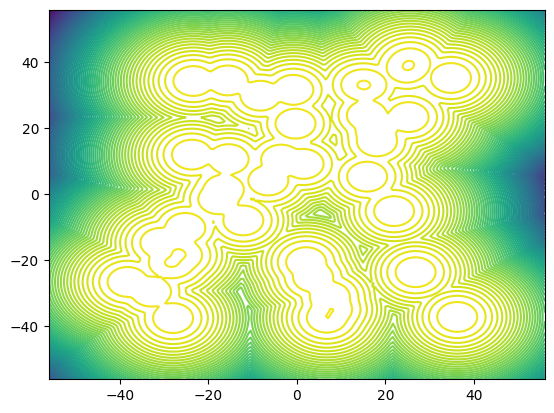

In [4]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0


if device == "cpu":
    use_gpu = False
else:
    use_gpu = True
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=use_gpu, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to(device)

### Helper Functions

In [5]:
def plot_dataset(samples, gen_samples=None):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)

   
    # plot dataset samples
    plot_marginal_pair(samples, ax=axs[0], bounds=plotting_bounds)
    axs[0].set_title("Buffer")

    if gen_samples is not None:
        plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
        # plot generated samples
        plot_marginal_pair(gen_samples, ax=axs[1], bounds=plotting_bounds)
        axs[1].set_title("Generated samples")

    else:
        #delete subplot
        fig.delaxes(axs[1])
        
    target.to(device)
    plt.show()
    return [fig]

In [6]:
def normalize(x, mins=-50, maxs=50):
    '''
        normalizes to [-1, 1]
    '''
    ## [ 0, 1 ]
    x = (x - mins) / (maxs - mins + 1e-5)
    ## [ -1, 1 ]
    x = x * 2 - 1
    
    return x, mins, maxs

def unnormalize(x, mins=-50, maxs=50):
    '''
        x : [ -1, 1 ]
    '''
    # assert x.max() <= 1 and x.min() >= -1, f'x range: ({x.min():.4f}, {x.max():.4f})'
    #x = x * std + mean
    x = (x + 1) / 2
    return x * (maxs - mins) + mins

## Function Definitions

### Estimated Reward Functions

In [9]:
# calculate the log expectation of the reward
def log_E_R(_x, _t, noise_schedule, num_mc_samples, var_exploding=True, orig_x=None):
    #h_t = beta * _t.repeat_interleave(num_mc_samples).unsqueeze(1)
    if orig_x is None:
        proposal_distribution = DummyProposalDistribution(noise_schedule)
    else:
        proposal_distribution = X0CenteredProposalDistribution(noise_schedule, orig_x)
    
    base_proposal_distribution = DummyProposalDistribution(noise_schedule)
    proposal_distribution.update(_x)
    base_proposal_distribution.update(_x)
    
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    
    h_t = noise_schedule.h(repeated_t)
    #h_t  = beta * repeated_t
    h_t = h_t.unsqueeze(1)
    if var_exploding:
        samples = proposal_distribution.sample(_t, num_mc_samples)
        log_importance_weights = (
            base_proposal_distribution.log_prob(samples, _t) -
            proposal_distribution.log_prob(samples, _t)
        )
        
        # variance exploding
        unnormalized_samples = unnormalize(samples, -50, 50)
        log_rewards = target.log_prob(unnormalized_samples)
    
        log_expectation_R = torch.logsumexp(log_importance_weights + log_rewards, dim=-1) - np.log(num_mc_samples)
    else:
        # variance preserving
        samples = (repeated_x/torch.sqrt(1 - repeated_t.unsqueeze(1)) 
                   + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5))
        log_rewards = target.log_prob(unnormalize(samples, -noise_schedule.norm_factor, noise_schedule.norm_factor))
        log_expectation_R = torch.log(1 / (1 - _t)) + torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R

In [10]:
def estimated_Rt(x, t, beta, num_mc_samples=100, var_exploding=True):
    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones(x.shape[0]).to(device)
    return torch.vmap(log_E_R, 
                      randomness='different', in_dims=(0,0,None,None))(x, t, beta, 
                                                                       num_mc_samples, var_exploding=var_exploding)

In [123]:
def estimate_grad_Rt(x, t, noise_schedule, num_mc_samples=200, var_exploding=True, richardson=False, proposal_distribution=None, orig_x=None):
    if x.ndim == 1:
        x = x.unsqueeze(0)
        t = t.unsqueeze(0)
    
    in_dims = (0,0,None,None, None, 0 if orig_x is not None else None)   
    est_scores_n = torch.vmap(torch.func.grad(log_E_R), 
                            in_dims=in_dims, randomness='different')(x, t, noise_schedule, num_mc_samples, 
                                                                     var_exploding,
                                                                     orig_x)
    norm = torch.linalg.vector_norm(est_scores_n, dim=-1)
    #print(norm.max())
    max_norm = 50
    clip_coeff = torch.clamp(max_norm / (norm+1e-6), max=1)
    clipped_f = est_scores_n * clip_coeff.unsqueeze(-1)
    
    return clipped_f#.clamp(min=-100.0, max=100.0)
    
    if richardson:
        est_scores_n_div2 = torch.vmap(torch.func.grad(log_E_R), 
                                   in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples//2, 
                                                                                         var_exploding=var_exploding)
        return (2*est_scores_n - est_scores_n_div2)
    else:
        return est_scores_n
    
def estimate_grad_Rt_jensen(x, t, noise_schedule, num_mc_samples=1000):
    repeated_x = x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    
    h_t = noise_schedule.h(repeated_t).unsqueeze(-1)
        
    samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
    
    log_rewards = target.log_prob(samples)#unnormalized_samples)
    gaussian_score = (samples - repeated_x) / (h_t + 1e-6)
    
    return (log_rewards.unsqueeze(-1) * gaussian_score).mean(dim=0)

def estimate_grad_Rt_log_trick(x, t, noise_schedule, num_mc_samples=1000, eps=1e-6):
    repeated_x = x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    
    h_t = noise_schedule.h(repeated_t).unsqueeze(-1)
        
    samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
    samples_denom = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
    
    rewards_num = target.log_prob(samples).exp().unsqueeze(-1)
    rewards_denom = target.log_prob(samples_denom).exp().unsqueeze(-1)
    
    gaussian_score = (samples - repeated_x) / (h_t + 1e-6)
    
    est_score = (rewards_num * gaussian_score).mean(dim=0) / (rewards_denom + eps).mean(dim=0)

    norm = torch.linalg.vector_norm(est_score, dim=-1)
    #print(norm.max())
    max_norm = 5e-1
    clip_coeff = torch.clamp(max_norm / (norm+1e-6), max=1)
    clipped_f = est_score * clip_coeff.unsqueeze(-1)
    
    return clipped_f

### True Reward Functions

In [7]:
def true_Rt(x, t, noise_schedule, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = noise_schedule.h(t)
    target.convolve(h_t, t, var_exploding=var_exploding) #  * (global_maxs **2)
    energy = target.log_prob(x)#unnormalize(x, global_mins, global_maxs))
    target.reset()
    return energy

In [8]:
def true_grad_Rt(x, t, noise_schedule, var_exploding=True):
    grad_fxn = torch.func.grad(true_Rt)
    vmapped_fxn = torch.vmap(grad_fxn, in_dims=(0, *([None] * 6)), randomness='different')

    orig_shape = copy.deepcopy(x.shape)
    x = x.flatten(0, 1)
    true_scores = vmapped_fxn(
        x.flatten(0, 1),
        t[0], 
        noise_schedule, 
        global_mins=-50,
        global_maxs=50,
        var_exploding=var_exploding
    )
        
    #samples_energy = true_Rt(x, t[0], noise_schedule, var_exploding=var_exploding)
    #true_scores = torch.autograd.grad(samples_energy.sum(), x, create_graph=True)[0].detach()
    return true_scores.reshape(orig_shape)

## SDE Tests

### Dataset

In [11]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0
num_samples = 10000

flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

/home/ray/anaconda3/lib/python3.9/site-packages/torch/_tensor.py:677: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1991.)
  LU, pivots, infos = torch._lu_with_info(


In [12]:
# normalize the dataset
init_num_samples = 2048
unnorm_true_samples = target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_init_samples)

global_mins_init = -50
global_maxs_init = 50

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size = 512, shuffle=True) 

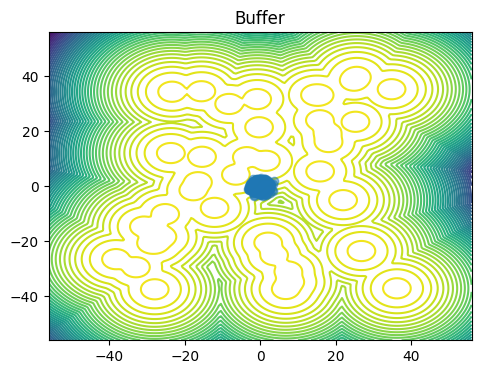

In [16]:
plot_dataset(unnorm_init_samples) # visualise the initial samples
plt.show()

### VE SDE

In [13]:
class VEReverseSDE(torch.nn.Module):
    noise_type = 'diagonal'
    sde_type = 'ito'
    
    def __init__(self, score, noise_schedule):
        super().__init__()
        self.score = score
        self.noise_schedule = noise_schedule
    
    def f(self, t, x):
        #import pdb; pdb.set_trace()
        with torch.enable_grad():
            if t.dim() == 0:
                # repeat the same time for all points if we have a scalar time
                t = t * torch.ones(x.shape[0]).to(device)

            x.requires_grad = True
            score = self.score(x, 1-t, self.noise_schedule)
        
        #import pdb; pdb.set_trace()
        return (self.g(t, x)**2) * score 
    
    def g(self, t, x):
        g = self.noise_schedule.g(1 - t)
        if g.ndim > 0:
            g = g.unsqueeze(1)
        else:
            g = torch.full_like(x, g)
            
        return g

In [14]:
from abc import ABC, abstractmethod

class NoiseSchedule(ABC):
    @abstractmethod
    def g(t):
        # Returns g(t)
        pass
    
    @abstractmethod
    def h(t):
        # Returns \int_0^t g(t)^2 dt
        pass

    
class LinearNoiseSchedule(NoiseSchedule):
    def __init__(self, beta, norm_factor=1.0):
        self.beta = beta / norm_factor
        self.norm_factor = norm_factor
        
    def g(self, t):
        return self.beta.sqrt()
    
    def h(self, t):
        return self.beta * t

class GeometricNoiseSchedule(NoiseSchedule):
    def __init__(self, sigma_min, sigma_max, norm_factor=1.0):
        self.sigma_min = sigma_min / norm_factor
        self.sigma_max = sigma_max / norm_factor
        self.sigma_diff = self.sigma_max / self.sigma_min
        
        self.norm_factor = norm_factor
        
    def g(self, t):
        # Let sigma_d = sigma_max / sigma_min
        # Then g(t) = sigma_min * sigma_d^t * sqrt{2 * log(sigma_d)}
        # See Eq 192 in https://arxiv.org/pdf/2206.00364.pdf
        return self.sigma_min * (self.sigma_diff ** t) * ((2 * np.log(self.sigma_diff)) ** 0.5)
        
    def h(self, t):
        # Let sigma_d = sigma_max / sigma_min
        # Then h(t) = \int_0^t g(z)^2 dz = sigma_min * sqrt{sigma_d^{2t} - 1}
        # see Eq 199 in https://arxiv.org/pdf/2206.00364.pdf
        return (self.sigma_min * (((self.sigma_diff ** (2 * t)) - 1) ** 0.5)) ** 2

In [15]:
def generate_samples(ve_reverse_sde, x_init):
    t = torch.linspace(0.001, 1.0, 500).to(device)
    with torch.no_grad():
        samples = torchsde.sdeint(ve_reverse_sde, x_init, t)
    return samples

In [18]:
def euler_maruyama_step(sde, x, t, dt):
    # Calculate drift and diffusion terms
    drift = sde.f(t, x) * dt
    diffusion = sde.g(t, x) * np.sqrt(dt) * torch.randn_like(x).to(device)

    # Update the state
    x_next = x + drift + diffusion
    return x_next, drift

def integrate_sde(sde, x0, t_span, dt):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    x = x0
    x0.requires_grad = True
    pred_v = []
    true_v = []
    samples = []
    with torch.no_grad():
        for t in times:
            x, f = euler_maruyama_step(sde, x, t, dt)
            samples.append(x)
            pred_v.append(f)
            # true_v.append(true_grad_Rt(x, 1-t, beta))
    return torch.stack(samples), torch.stack(pred_v) # , torch.stack(true_v)

In [19]:
num_samples = 512
beta = noise_schedule.h(1.0)

var = beta * (50 ** 2)
with torch.no_grad():
    target.convolve(torch.tensor(beta * (50 ** 2), device=torch.device('cpu')), 1) 
    x1_samples = target.sample((num_samples,))
    target.reset()
    #x1_samples = torch.randn((num_samples, 2), device='cuda') * (var ** 0.5)
    x1_samples_normalized = normalize(x1_samples)[0]

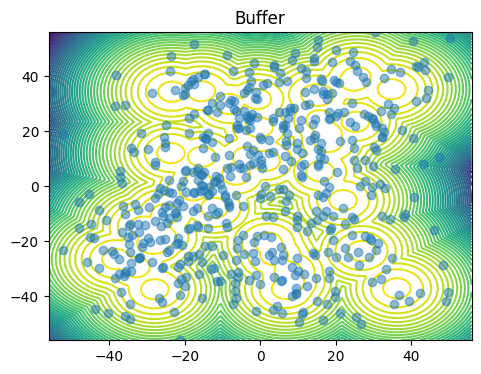

[<Figure size 1200x400 with 1 Axes>]

In [20]:
plot_dataset(x1_samples)

In [45]:
vals = target.sample((10000,))

In [17]:
# ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
#noise_schedule = LinearNoiseSchedule(torch.tensor(500), 50 ** 2)
noise_schedule = GeometricNoiseSchedule(0.01, 500, 50 ** 2)
#noise_schedule = GeometricNoiseSchedule(0.01, 40, 1)

In [23]:
num_samples = 512
beta = noise_schedule.h(1.0)

var = beta * (50 ** 2)
with torch.no_grad():
    target.convolve(torch.tensor(var, device=torch.device('cpu')), 1) 
    x1_samples = target.sample((num_samples,))
    target.reset()
    #x1_samples = torch.randn((num_samples, 2), device='cuda') * (var ** 0.5)
    x1_samples_normalized = normalize(x1_samples)[0]

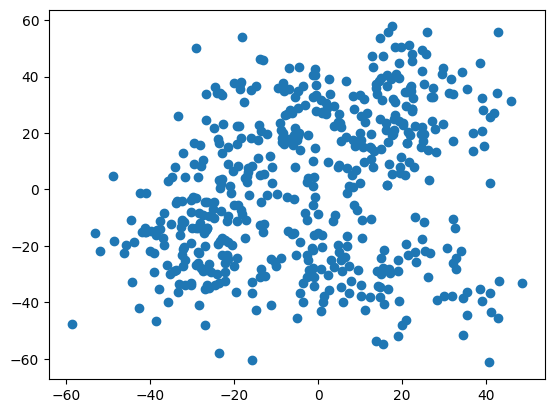

In [24]:
plt.scatter(*x1_samples.cpu().detach().T)

In [147]:
noise_schedule.h(1)

1599.9999

In [32]:
ve_reverse_sde = VEReverseSDE(estimate_grad_Rt, noise_schedule)
# samples = generate_samples(ve_reverse_sde, x1_s'amples_normalized)
samples, pred_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1.0], 0.001) #true_vectors

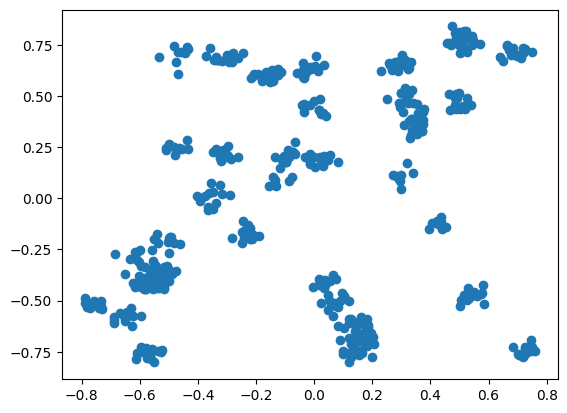

In [33]:
plt.scatter(*samples[-1].T.cpu().detach())

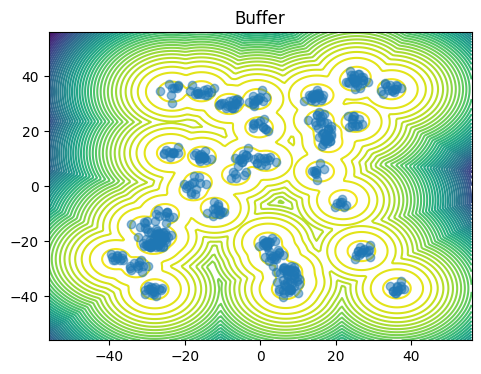

[<Figure size 1200x400 with 1 Axes>]

In [35]:
plot_dataset(unnormalize(samples[-1],-50,50))

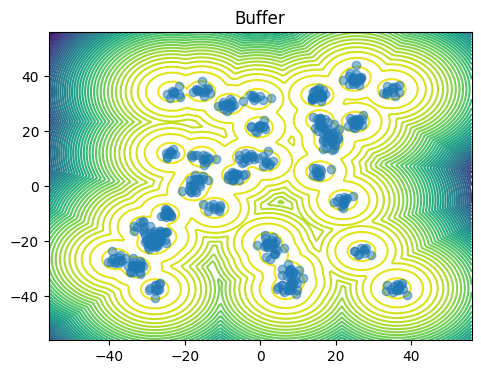

[<Figure size 1200x400 with 1 Axes>]

In [61]:
plot_dataset(unnormalize(samples[-1], global_mins_init, global_maxs_init))

In [50]:
target.convolve(noise_schedule.h(0.01) * 50 * 50, 1)
v = target.sample((512,))
target.reset()
plot_dataset(v)

AttributeError: 'float' object has no attribute 'to'

In [ ]:
plot_dataset(unnormalize(true_samples[-1], global_mins_init, global_maxs_init))

In [ ]:
plot_dataset(unnormalize(model_samples[-1], global_mins_init, global_maxs_init))

In [ ]:
unnormalized_samples = unnormalize(samples, global_mins_init, global_maxs_init)

plt.plot(torch.arange(0, 1.0, 0.001), unnormalized_samples[:, 105:110, 0].detach().cpu())
plt.xlabel('time')
plt.show()

In [ ]:
unnormalized_samples = unnormalize(model_samples, global_mins_init, global_maxs_init)

plt.plot(torch.arange(0, 1.0, 0.001), unnormalized_samples[:, 105:110, 0].detach().cpu())
plt.xlabel('time')
plt.show()

In [528]:
ve_reverse_sde = VEReverseSDE(true_grad_Rt, noise_schedule)
# samples = generate_samples(ve_reverse_sde, x1_samples_normalized)
true_samples, true_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 0.999], 0.001) #true_vectors

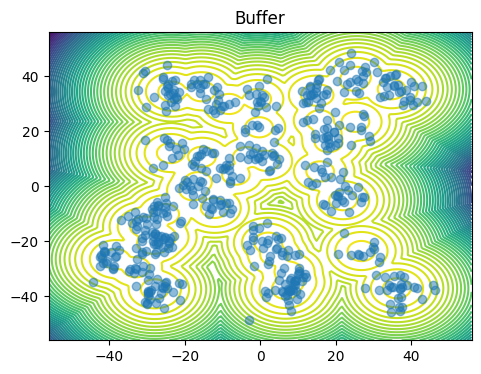

[<Figure size 1200x400 with 1 Axes>]

In [529]:
plot_dataset(unnormalize(true_samples[-1], global_mins_init, global_maxs_init))

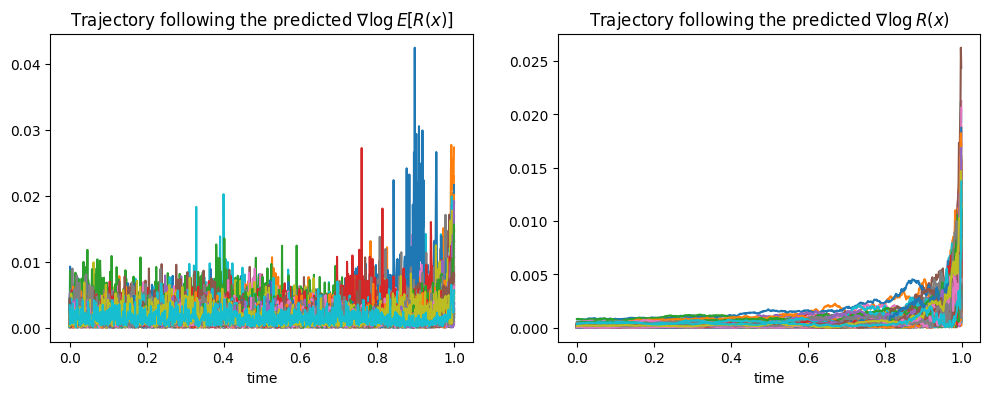

In [26]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
# predicted 
traj_pred = torch.cumsum(pred_vectors, dim=-1)
axs[0].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_pred[:,:200], dim=-1).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
traj_true = torch.cumsum(true_vectors, dim=-1)
axs[1].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_true[:,:200], dim=-1).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the predicted $\nabla \log R(x)$")

plt.show()

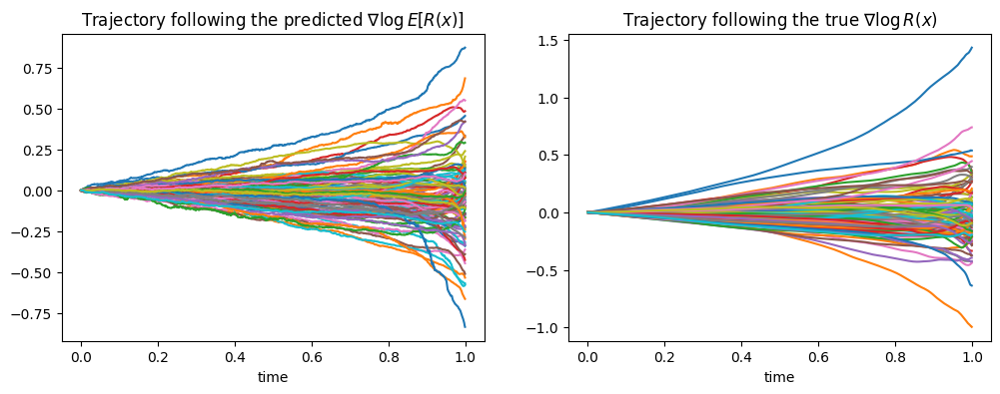

In [27]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# predicted 
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_pred, dim=0).cpu())
axs[0].plot(torch.arange(0, 1, 0.001)[:], torch.cumsum(pred_vectors[:, :100, 0], dim=0).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_true, dim=0).cpu())
axs[1].plot(torch.arange(0, 1, 0.001), torch.cumsum(true_vectors[:, :100, 0], dim=0).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the true $\nabla \log R(x)$")

plt.show()

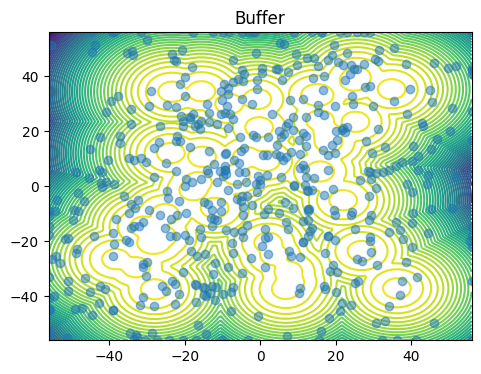

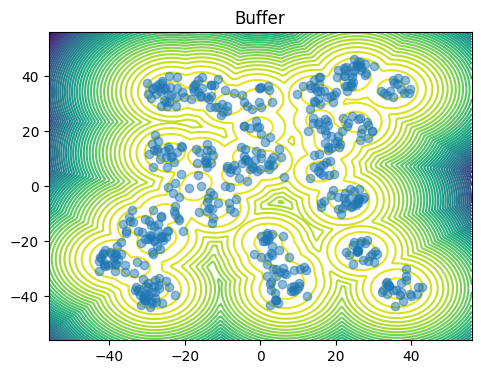

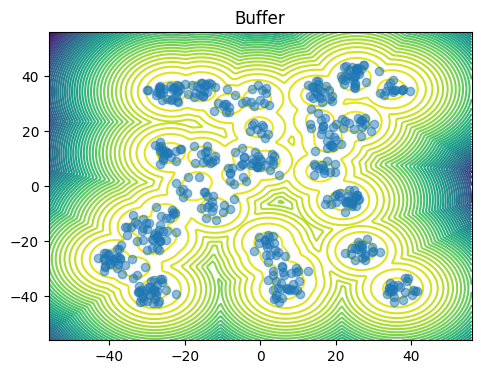

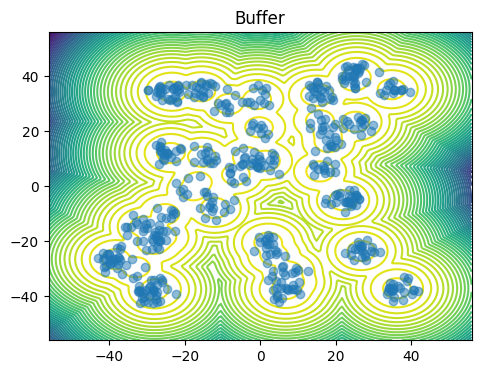

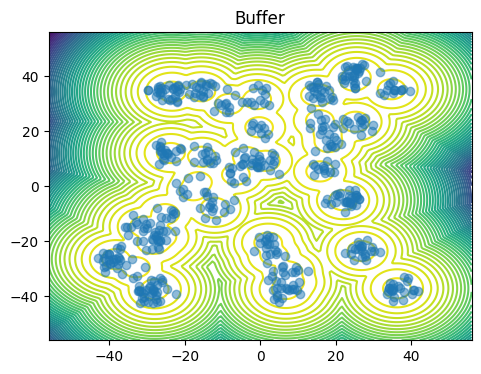

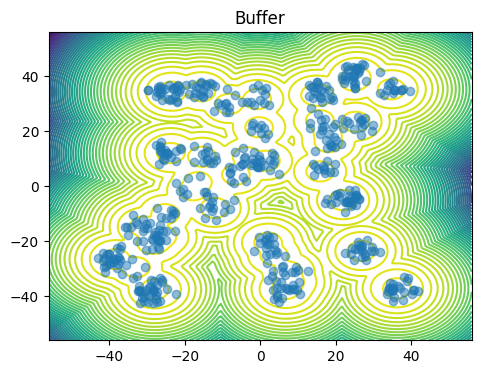

In [553]:
for i in range(0, samples.shape[0], 199):
    plot_dataset(unnormalize(samples[i], global_mins_init, global_maxs_init))

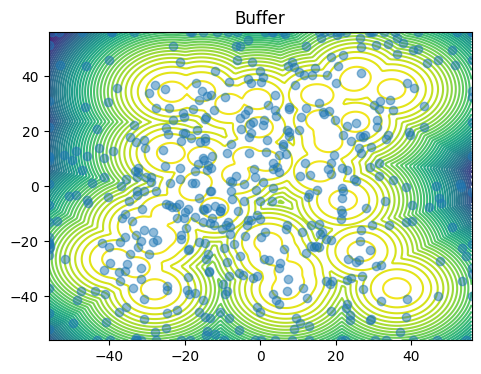

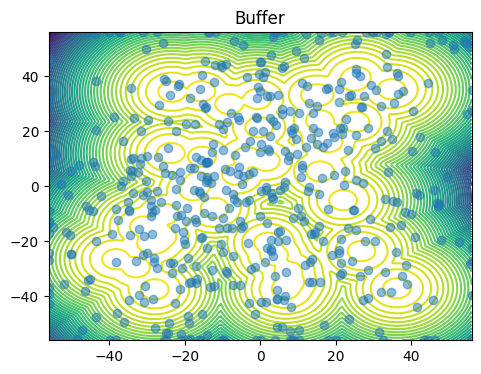

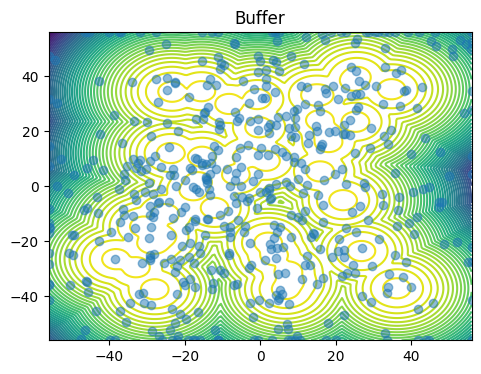

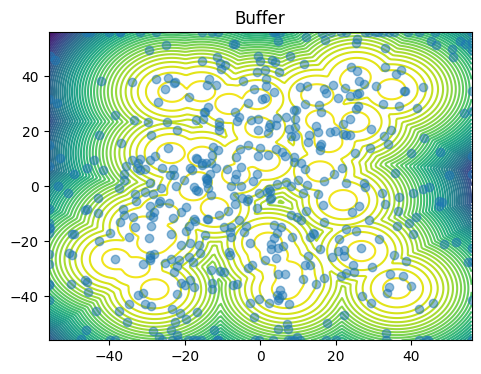

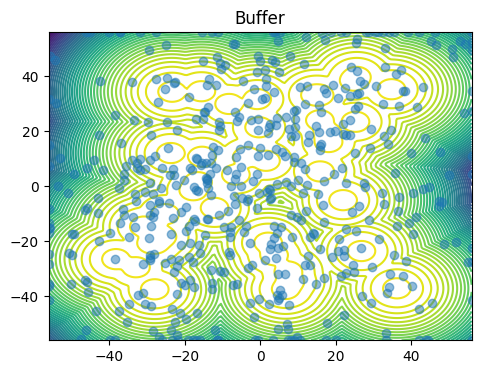

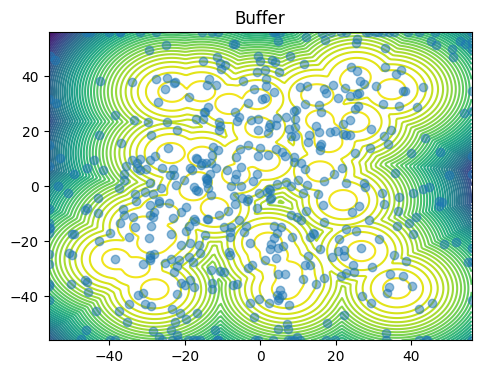

In [440]:
for i in range(0, true_samples.shape[0], 199):
    plot_dataset(unnormalize(true_samples[i], global_mins_init, global_maxs_init))

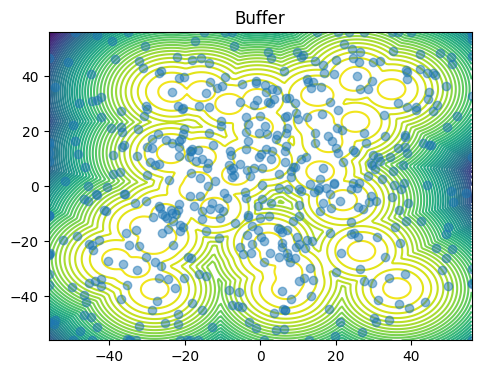

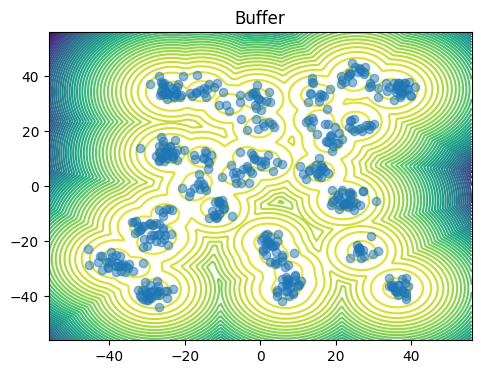

[<Figure size 1200x400 with 1 Axes>]

In [177]:
plot_dataset(unnormalize(true_samples[0], global_mins_init, global_maxs_init))
plot_dataset(unnormalize(true_samples[30], global_mins_init, global_maxs_init))

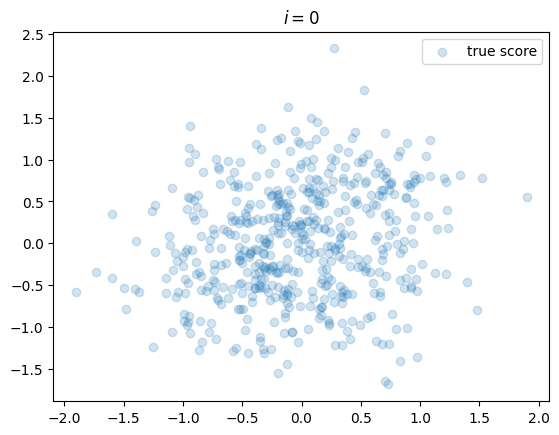

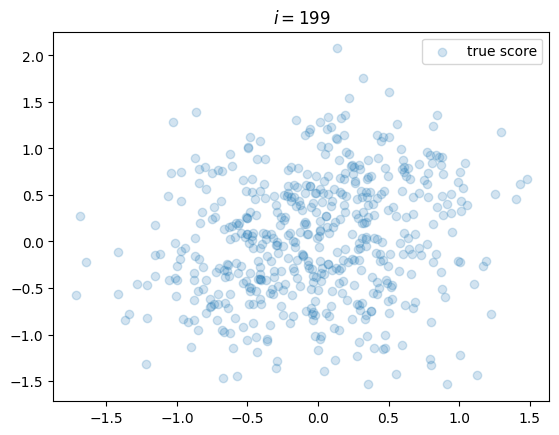

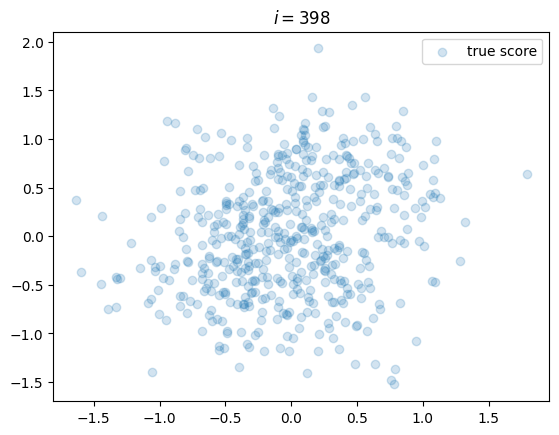

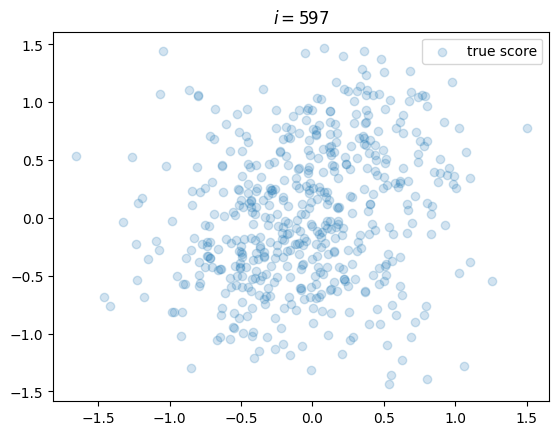

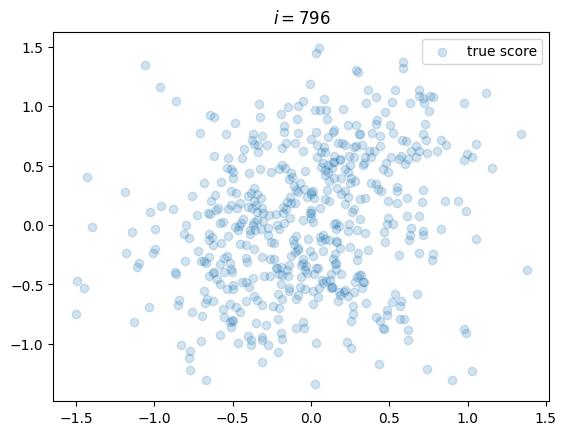

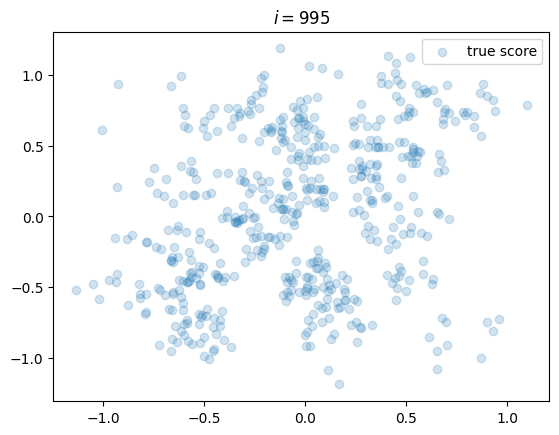

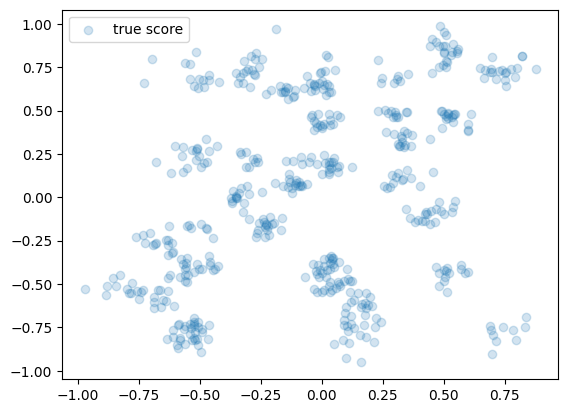

In [161]:
for i in range(0, model_samples.shape[0], 199):
    #plt.scatter(*model_samples[i].T.detach().cpu(), alpha=0.2, label='model')
    plt.scatter(*true_samples[i].T.detach().cpu(), alpha=0.2, label='true score')
    #plt.scatter(*samples[i].T.detach().cpu(), alpha=0.2, label='estimated score')
    plt.legend()
    plt.title(r'$i=%d$' % i)

    #plot_dataset(unnormalize(model_samples[i], global_mins_init, global_maxs_init))
    plt.show()
    
plt.scatter(*true_samples[-1].T.detach().cpu(), alpha=0.2, label='true score')
plt.legend()
plt.show()

ValueError: tensor([0.0000, 0.0010, 0.0020, 0.0030, 0.0040, 0.0050, 0.0060, 0.0070, 0.0080,
        0.0090, 0.0100, 0.0110, 0.0120, 0.0130, 0.0140, 0.0150, 0.0160, 0.0170,
        0.0180, 0.0190, 0.0200, 0.0210, 0.0220, 0.0230, 0.0240, 0.0250, 0.0260,
        0.0270, 0.0280, 0.0290, 0.0300, 0.0310, 0.0320, 0.0330, 0.0340, 0.0350,
        0.0360, 0.0370, 0.0380, 0.0390, 0.0400, 0.0410, 0.0420, 0.0430, 0.0440,
        0.0450, 0.0460, 0.0470, 0.0480, 0.0490, 0.0501, 0.0511, 0.0521, 0.0531,
        0.0541, 0.0551, 0.0561, 0.0571, 0.0581, 0.0591, 0.0601, 0.0611, 0.0621,
        0.0631, 0.0641, 0.0651, 0.0661, 0.0671, 0.0681, 0.0691, 0.0701, 0.0711,
        0.0721, 0.0731, 0.0741, 0.0751, 0.0761, 0.0771, 0.0781, 0.0791, 0.0801,
        0.0811, 0.0821, 0.0831, 0.0841, 0.0851, 0.0861, 0.0871, 0.0881, 0.0891,
        0.0901, 0.0911, 0.0921, 0.0931, 0.0941, 0.0951, 0.0961, 0.0971, 0.0981,
        0.0991, 0.1001, 0.1011, 0.1021, 0.1031, 0.1041, 0.1051, 0.1061, 0.1071,
        0.1081, 0.1091, 0.1101, 0.1111, 0.1121, 0.1131, 0.1141, 0.1151, 0.1161,
        0.1171, 0.1181, 0.1191, 0.1201, 0.1211, 0.1221, 0.1231, 0.1241, 0.1251,
        0.1261, 0.1271, 0.1281, 0.1291, 0.1301, 0.1311, 0.1321, 0.1331, 0.1341,
        0.1351, 0.1361, 0.1371, 0.1381, 0.1391, 0.1401, 0.1411, 0.1421, 0.1431,
        0.1441, 0.1451, 0.1461, 0.1471, 0.1481, 0.1491, 0.1502, 0.1512, 0.1522,
        0.1532, 0.1542, 0.1552, 0.1562, 0.1572, 0.1582, 0.1592, 0.1602, 0.1612,
        0.1622, 0.1632, 0.1642, 0.1652, 0.1662, 0.1672, 0.1682, 0.1692, 0.1702,
        0.1712, 0.1722, 0.1732, 0.1742, 0.1752, 0.1762, 0.1772, 0.1782, 0.1792,
        0.1802, 0.1812, 0.1822, 0.1832, 0.1842, 0.1852, 0.1862, 0.1872, 0.1882,
        0.1892, 0.1902, 0.1912, 0.1922, 0.1932, 0.1942, 0.1952, 0.1962, 0.1972,
        0.1982, 0.1992, 0.2002, 0.2012, 0.2022, 0.2032, 0.2042, 0.2052, 0.2062,
        0.2072, 0.2082, 0.2092, 0.2102, 0.2112, 0.2122, 0.2132, 0.2142, 0.2152,
        0.2162, 0.2172, 0.2182, 0.2192, 0.2202, 0.2212, 0.2222, 0.2232, 0.2242,
        0.2252, 0.2262, 0.2272, 0.2282, 0.2292, 0.2302, 0.2312, 0.2322, 0.2332,
        0.2342, 0.2352, 0.2362, 0.2372, 0.2382, 0.2392, 0.2402, 0.2412, 0.2422,
        0.2432, 0.2442, 0.2452, 0.2462, 0.2472, 0.2482, 0.2492, 0.2503, 0.2513,
        0.2523, 0.2533, 0.2543, 0.2553, 0.2563, 0.2573, 0.2583, 0.2593, 0.2603,
        0.2613, 0.2623, 0.2633, 0.2643, 0.2653, 0.2663, 0.2673, 0.2683, 0.2693,
        0.2703, 0.2713, 0.2723, 0.2733, 0.2743, 0.2753, 0.2763, 0.2773, 0.2783,
        0.2793, 0.2803, 0.2813, 0.2823, 0.2833, 0.2843, 0.2853, 0.2863, 0.2873,
        0.2883, 0.2893, 0.2903, 0.2913, 0.2923, 0.2933, 0.2943, 0.2953, 0.2963,
        0.2973, 0.2983, 0.2993, 0.3003, 0.3013, 0.3023, 0.3033, 0.3043, 0.3053,
        0.3063, 0.3073, 0.3083, 0.3093, 0.3103, 0.3113, 0.3123, 0.3133, 0.3143,
        0.3153, 0.3163, 0.3173, 0.3183, 0.3193, 0.3203, 0.3213, 0.3223, 0.3233,
        0.3243, 0.3253, 0.3263, 0.3273, 0.3283, 0.3293, 0.3303, 0.3313, 0.3323,
        0.3333, 0.3343, 0.3353, 0.3363, 0.3373, 0.3383, 0.3393, 0.3403, 0.3413,
        0.3423, 0.3433, 0.3443, 0.3453, 0.3463, 0.3473, 0.3483, 0.3493, 0.3504,
        0.3514, 0.3524, 0.3534, 0.3544, 0.3554, 0.3564, 0.3574, 0.3584, 0.3594,
        0.3604, 0.3614, 0.3624, 0.3634, 0.3644, 0.3654, 0.3664, 0.3674, 0.3684,
        0.3694, 0.3704, 0.3714, 0.3724, 0.3734, 0.3744, 0.3754, 0.3764, 0.3774,
        0.3784, 0.3794, 0.3804, 0.3814, 0.3824, 0.3834, 0.3844, 0.3854, 0.3864,
        0.3874, 0.3884, 0.3894, 0.3904, 0.3914, 0.3924, 0.3934, 0.3944, 0.3954,
        0.3964, 0.3974, 0.3984, 0.3994, 0.4004, 0.4014, 0.4024, 0.4034, 0.4044,
        0.4054, 0.4064, 0.4074, 0.4084, 0.4094, 0.4104, 0.4114, 0.4124, 0.4134,
        0.4144, 0.4154, 0.4164, 0.4174, 0.4184, 0.4194, 0.4204, 0.4214, 0.4224,
        0.4234, 0.4244, 0.4254, 0.4264, 0.4274, 0.4284, 0.4294, 0.4304, 0.4314,
        0.4324, 0.4334, 0.4344, 0.4354, 0.4364, 0.4374, 0.4384, 0.4394, 0.4404,
        0.4414, 0.4424, 0.4434, 0.4444, 0.4454, 0.4464, 0.4474, 0.4484, 0.4494,
        0.4505, 0.4515, 0.4525, 0.4535, 0.4545, 0.4555, 0.4565, 0.4575, 0.4585,
        0.4595, 0.4605, 0.4615, 0.4625, 0.4635, 0.4645, 0.4655, 0.4665, 0.4675,
        0.4685, 0.4695, 0.4705, 0.4715, 0.4725, 0.4735, 0.4745, 0.4755, 0.4765,
        0.4775, 0.4785, 0.4795, 0.4805, 0.4815, 0.4825, 0.4835, 0.4845, 0.4855,
        0.4865, 0.4875, 0.4885, 0.4895, 0.4905, 0.4915, 0.4925, 0.4935, 0.4945,
        0.4955, 0.4965, 0.4975, 0.4985, 0.4995, 0.5005, 0.5015, 0.5025, 0.5035,
        0.5045, 0.5055, 0.5065, 0.5075, 0.5085, 0.5095, 0.5105, 0.5115, 0.5125,
        0.5135, 0.5145, 0.5155, 0.5165, 0.5175, 0.5185, 0.5195, 0.5205, 0.5215,
        0.5225, 0.5235, 0.5245, 0.5255, 0.5265, 0.5275, 0.5285, 0.5295, 0.5305,
        0.5315, 0.5325, 0.5335, 0.5345, 0.5355, 0.5365, 0.5375, 0.5385, 0.5395,
        0.5405, 0.5415, 0.5425, 0.5435, 0.5445, 0.5455, 0.5465, 0.5475, 0.5485,
        0.5495, 0.5506, 0.5516, 0.5526, 0.5536, 0.5546, 0.5556, 0.5566, 0.5576,
        0.5586, 0.5596, 0.5606, 0.5616, 0.5626, 0.5636, 0.5646, 0.5656, 0.5666,
        0.5676, 0.5686, 0.5696, 0.5706, 0.5716, 0.5726, 0.5736, 0.5746, 0.5756,
        0.5766, 0.5776, 0.5786, 0.5796, 0.5806, 0.5816, 0.5826, 0.5836, 0.5846,
        0.5856, 0.5866, 0.5876, 0.5886, 0.5896, 0.5906, 0.5916, 0.5926, 0.5936,
        0.5946, 0.5956, 0.5966, 0.5976, 0.5986, 0.5996, 0.6006, 0.6016, 0.6026,
        0.6036, 0.6046, 0.6056, 0.6066, 0.6076, 0.6086, 0.6096, 0.6106, 0.6116,
        0.6126, 0.6136, 0.6146, 0.6156, 0.6166, 0.6176, 0.6186, 0.6196, 0.6206,
        0.6216, 0.6226, 0.6236, 0.6246, 0.6256, 0.6266, 0.6276, 0.6286, 0.6296,
        0.6306, 0.6316, 0.6326, 0.6336, 0.6346, 0.6356, 0.6366, 0.6376, 0.6386,
        0.6396, 0.6406, 0.6416, 0.6426, 0.6436, 0.6446, 0.6456, 0.6466, 0.6476,
        0.6486, 0.6496, 0.6507, 0.6517, 0.6527, 0.6537, 0.6547, 0.6557, 0.6567,
        0.6577, 0.6587, 0.6597, 0.6607, 0.6617, 0.6627, 0.6637, 0.6647, 0.6657,
        0.6667, 0.6677, 0.6687, 0.6697, 0.6707, 0.6717, 0.6727, 0.6737, 0.6747,
        0.6757, 0.6767, 0.6777, 0.6787, 0.6797, 0.6807, 0.6817, 0.6827, 0.6837,
        0.6847, 0.6857, 0.6867, 0.6877, 0.6887, 0.6897, 0.6907, 0.6917, 0.6927,
        0.6937, 0.6947, 0.6957, 0.6967, 0.6977, 0.6987, 0.6997, 0.7007, 0.7017,
        0.7027, 0.7037, 0.7047, 0.7057, 0.7067, 0.7077, 0.7087, 0.7097, 0.7107,
        0.7117, 0.7127, 0.7137, 0.7147, 0.7157, 0.7167, 0.7177, 0.7187, 0.7197,
        0.7207, 0.7217, 0.7227, 0.7237, 0.7247, 0.7257, 0.7267, 0.7277, 0.7287,
        0.7297, 0.7307, 0.7317, 0.7327, 0.7337, 0.7347, 0.7357, 0.7367, 0.7377,
        0.7387, 0.7397, 0.7407, 0.7417, 0.7427, 0.7437, 0.7447, 0.7457, 0.7467,
        0.7477, 0.7487, 0.7497, 0.7508, 0.7518, 0.7528, 0.7538, 0.7548, 0.7558,
        0.7568, 0.7578, 0.7588, 0.7598, 0.7608, 0.7618, 0.7628, 0.7638, 0.7648,
        0.7658, 0.7668, 0.7678, 0.7688, 0.7698, 0.7708, 0.7718, 0.7728, 0.7738,
        0.7748, 0.7758, 0.7768, 0.7778, 0.7788, 0.7798, 0.7808, 0.7818, 0.7828,
        0.7838, 0.7848, 0.7858, 0.7868, 0.7878, 0.7888, 0.7898, 0.7908, 0.7918,
        0.7928, 0.7938, 0.7948, 0.7958, 0.7968, 0.7978, 0.7988, 0.7998, 0.8008,
        0.8018, 0.8028, 0.8038, 0.8048, 0.8058, 0.8068, 0.8078, 0.8088, 0.8098,
        0.8108, 0.8118, 0.8128, 0.8138, 0.8148, 0.8158, 0.8168, 0.8178, 0.8188,
        0.8198, 0.8208, 0.8218, 0.8228, 0.8238, 0.8248, 0.8258, 0.8268, 0.8278,
        0.8288, 0.8298, 0.8308, 0.8318, 0.8328, 0.8338, 0.8348, 0.8358, 0.8368,
        0.8378, 0.8388, 0.8398, 0.8408, 0.8418, 0.8428, 0.8438, 0.8448, 0.8458,
        0.8468, 0.8478, 0.8488, 0.8498, 0.8509, 0.8519, 0.8529, 0.8539, 0.8549,
        0.8559, 0.8569, 0.8579, 0.8589, 0.8599, 0.8609, 0.8619, 0.8629, 0.8639,
        0.8649, 0.8659, 0.8669, 0.8679, 0.8689, 0.8699, 0.8709, 0.8719, 0.8729,
        0.8739, 0.8749, 0.8759, 0.8769, 0.8779, 0.8789, 0.8799, 0.8809, 0.8819,
        0.8829, 0.8839, 0.8849, 0.8859, 0.8869, 0.8879, 0.8889, 0.8899, 0.8909,
        0.8919, 0.8929, 0.8939, 0.8949, 0.8959, 0.8969, 0.8979, 0.8989, 0.8999,
        0.9009, 0.9019, 0.9029, 0.9039, 0.9049, 0.9059, 0.9069, 0.9079, 0.9089,
        0.9099, 0.9109, 0.9119, 0.9129, 0.9139, 0.9149, 0.9159, 0.9169, 0.9179,
        0.9189, 0.9199, 0.9209, 0.9219, 0.9229, 0.9239, 0.9249, 0.9259, 0.9269,
        0.9279, 0.9289, 0.9299, 0.9309, 0.9319, 0.9329, 0.9339, 0.9349, 0.9359,
        0.9369, 0.9379, 0.9389, 0.9399, 0.9409, 0.9419, 0.9429, 0.9439, 0.9449,
        0.9459, 0.9469, 0.9479, 0.9489, 0.9499, 0.9510, 0.9520, 0.9530, 0.9540,
        0.9550, 0.9560, 0.9570, 0.9580, 0.9590, 0.9600, 0.9610, 0.9620, 0.9630,
        0.9640, 0.9650, 0.9660, 0.9670, 0.9680, 0.9690, 0.9700, 0.9710, 0.9720,
        0.9730, 0.9740, 0.9750, 0.9760, 0.9770, 0.9780, 0.9790, 0.9800, 0.9810,
        0.9820, 0.9830, 0.9840, 0.9850, 0.9860, 0.9870, 0.9880, 0.9890, 0.9900,
        0.9910, 0.9920, 0.9930, 0.9940, 0.9950, 0.9960, 0.9970, 0.9980, 0.9990,
        1.0000]) is not a valid value for color

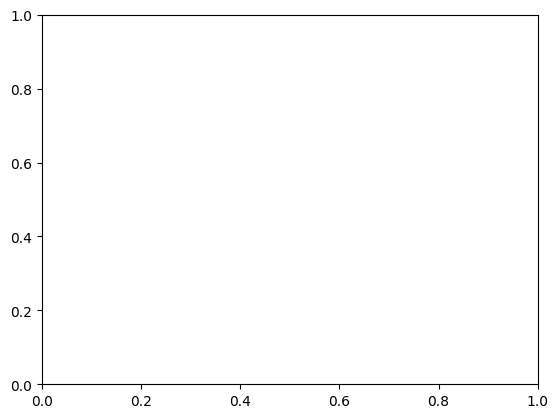

In [109]:
plt.plot(model_samples[:, 0, 0].detach().cpu(), model_samples[:,0,1].detach().cpu(), c=torch.linspace(0, 1, len(model_samples)))

### Training

In [47]:
def reward_matching_loss_biased(vectorfield, x, t, noise_schedule): 
    h_t = noise_schedule.h(t)
    #h_t = beta * t.unsqueeze(1)
    x.requires_grad = True

    # noisy sample: x(t)
    noisy_x = torch.normal(x, h_t.unsqueeze(1) ** 0.5)
    pred_scores = vectorfield(noisy_x, t)

    estimated_scores = estimate_grad_Rt(noisy_x, t, noise_schedule)
    import pdb; pdb.set_trace()
    estimated_scores = estimated_scores * (h_t + 1e-3).unsqueeze(1)
    #estimated_scores = true_grad_Rt(x, t, noise_schedule) * (h_t + 5e-3).unsqueeze(1)
    #norm = torch.linalg.vector_norm(estimated_scores, dim=-1)
    #print(norm.max())
    #max_norm = 100
    #clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
    #estimated_scores = estimated_scores * clip_coef.unsqueeze(-1)
    

    return ((estimated_scores - pred_scores)**2) / ((h_t + 1e-3).unsqueeze(1))

In [37]:
def score_loss(vectorfield, x, t):
    h_t = beta * t.unsqueeze(1)
    # x(t)
    x_t = torch.normal(x, h_t ** 0.5)
    s_pred = vectorfield(x_t, t)

    s_true = - (x_t - x)/ h_t 
    return ((s_pred - s_true)**2) / ((h_t + 1e-2))#.mean()    

In [38]:
import torch.distributions as dist
class LogUniform(dist.TransformedDistribution):
    def __init__(self, lb, ub):
        super(LogUniform, self).__init__(dist.Uniform(lb.log(), ub.log()),
                                         dist.ExpTransform())

In [40]:
beta = 0.2
vectorfield = MyMLP().to(device)

In [ ]:
#vectorfield.load_state_dict(torch.load('/mnt/user_storage/long_trained_reward_matching_gmm.pt'))

In [41]:
opt_vectorfield = Adam(vectorfield.parameters(), lr=1e-3)

In [42]:
# buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
#                       device=device, fill_buffer_during_init=False, sample_with_replacement=True)
buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
                      device=device, fill_buffer_during_init=False, 
                      sample_with_replacement=True, prioritize=True)

# x1_energy = target.log_prob(x1_samples).detach()
# buffer.add(x1_samples_normalized, x1_energy)
buffer.add(init_samples, init_energy)

Buffer not initialised, expected that checkpoint will be loaded.


In [43]:
outer_epochs= 10000
inner_epochs = 10

num_samples = 2048 

#train_dataset = TensorDataset(x1_samples_normalized.clone(), x1_energy.clone())
train_dataset = TensorDataset(init_samples.clone(), init_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True) 
global_mins, global_maxs = global_mins_init, global_maxs_init

In [44]:
init_num_samples = 2048
unnorm_true_samples = (
    target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
)
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_true_samples)

global_mins_init = -50
global_maxs_init = 50

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size=512, shuffle=True)

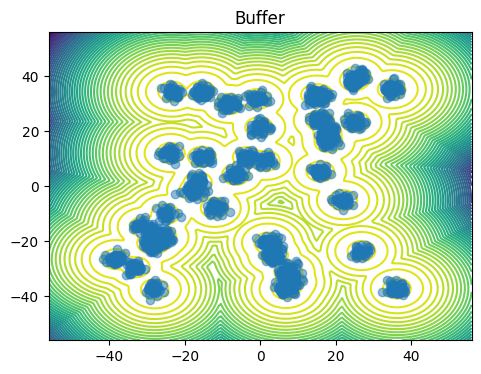

[<Figure size 1200x400 with 1 Axes>]

In [45]:
plot_dataset(unnormalize(init_samples, global_mins, global_maxs))

  0%|          | 0/10000 [00:00<?, ?it/s]

> /tmp/ipykernel_823549/2294338938.py(12)reward_matching_loss_biased()
     10     estimated_scores = estimate_grad_Rt(noisy_x, t, noise_schedule)
     11     import pdb; pdb.set_trace()
---> 12     estimated_scores = estimated_scores * (h_t + 1e-3).unsqueeze(1)
     13     #estimated_scores = true_grad_Rt(x, t, noise_schedule) * (h_t + 5e-3).unsqueeze(1)
     14     #norm = torch.linalg.vector_norm(estimated_scores, dim=-1)



ipdb>  estimated_score


*** NameError: name 'estimated_score' is not defined


ipdb>  estimated_scores


tensor([[  6.2670,   4.6652],
        [ 30.4669,  15.5172],
        [ 22.7686, -13.2970],
        ...,
        [-16.1211, -23.0716],
        [ 28.2920,  63.9591],
        [-17.9890,  -2.3519]], device='cuda:0', grad_fn=<MulBackward0>)


ipdb>  estimated_scores[t.argsort()]


tensor([[ -6.1792,  37.1931],
        [-22.5836, -47.2905],
        [  6.8732,  10.2217],
        ...,
        [ -3.7977,   6.9080],
        [ -0.6947,   0.5957],
        [  3.5682,   2.6302]], device='cuda:0', grad_fn=<IndexBackward0>)


ipdb>  t


tensor([0.5837, 0.6134, 0.0274, 0.8710, 0.7003, 0.9017, 0.8963, 0.9972, 0.8362,
        0.6221, 0.3779, 0.4415, 0.7871, 0.9041, 0.9659, 0.3788, 0.9874, 0.4593,
        0.9940, 0.0680, 0.7931, 0.8047, 0.8441, 0.4651, 0.6353, 0.5615, 0.0086,
        0.5478, 0.1503, 0.5908, 0.4668, 0.1218, 0.0368, 0.9872, 0.4814, 0.6908,
        0.1552, 0.6693, 0.4884, 0.4176, 0.4822, 0.0557, 0.5002, 0.9497, 0.5576,
        0.4239, 0.0561, 0.3358, 0.2504, 0.5328, 0.7589, 0.7115, 0.9453, 0.1290,
        0.2121, 0.8711, 0.2418, 0.2792, 0.2921, 0.5968, 0.5038, 0.8882, 0.3003,
        0.9848, 0.3710, 0.3093, 0.6286, 0.5306, 0.6086, 0.3427, 0.3023, 0.7359,
        0.8415, 0.9698, 0.1330, 0.1454, 0.4052, 0.2318, 0.9973, 0.9788, 0.8568,
        0.1707, 0.8450, 0.7867, 0.5958, 0.8484, 0.7319, 0.5074, 0.7128, 0.4800,
        0.5162, 0.5498, 0.6434, 0.0784, 0.1893, 0.7782, 0.4590, 0.4631, 0.4178,
        0.5662, 0.7045, 0.6292, 0.0284, 0.6609, 0.2091, 0.2453, 0.8295, 0.4979,
        0.6516, 0.2702, 0.9844, 0.1975, 

ipdb>  t[t.argsort()]


tensor([0.0017, 0.0033, 0.0086, 0.0133, 0.0153, 0.0206, 0.0221, 0.0240, 0.0272,
        0.0274, 0.0284, 0.0286, 0.0366, 0.0368, 0.0373, 0.0389, 0.0400, 0.0421,
        0.0430, 0.0439, 0.0446, 0.0446, 0.0485, 0.0486, 0.0501, 0.0522, 0.0545,
        0.0552, 0.0552, 0.0557, 0.0561, 0.0570, 0.0604, 0.0649, 0.0659, 0.0677,
        0.0680, 0.0682, 0.0691, 0.0740, 0.0784, 0.0801, 0.0824, 0.0849, 0.0854,
        0.0880, 0.0893, 0.0895, 0.0935, 0.0937, 0.0945, 0.1007, 0.1031, 0.1062,
        0.1067, 0.1070, 0.1114, 0.1143, 0.1150, 0.1167, 0.1218, 0.1265, 0.1290,
        0.1291, 0.1291, 0.1296, 0.1314, 0.1328, 0.1330, 0.1355, 0.1450, 0.1454,
        0.1503, 0.1526, 0.1552, 0.1580, 0.1587, 0.1598, 0.1628, 0.1629, 0.1630,
        0.1650, 0.1698, 0.1698, 0.1704, 0.1707, 0.1740, 0.1755, 0.1762, 0.1793,
        0.1837, 0.1838, 0.1843, 0.1893, 0.1931, 0.1965, 0.1975, 0.2018, 0.2059,
        0.2084, 0.2091, 0.2093, 0.2099, 0.2121, 0.2123, 0.2124, 0.2146, 0.2152,
        0.2183, 0.2216, 0.2269, 0.2279, 

ipdb>  estimated_scores[t.argsort()]


tensor([[ -6.1792,  37.1931],
        [-22.5836, -47.2905],
        [  6.8732,  10.2217],
        ...,
        [ -3.7977,   6.9080],
        [ -0.6947,   0.5957],
        [  3.5682,   2.6302]], device='cuda:0', grad_fn=<IndexBackward0>)


ipdb>  torch.linalg.vector_norm(estimated_scores[t.argsort()],dim=-1)


tensor([ 37.7029,  52.4062,  12.3176,  18.6149,  66.8214,  52.4816,   4.7990,
         44.8564,  62.6869,  26.3670,  19.6007,  26.3202,  23.7727,  61.2938,
         39.3698,  24.9663,  26.4145,  32.5942,  37.8644,  66.6877,  21.9455,
         80.5040,  56.6683,  20.4046,  45.2679,  61.8459,  12.6822,  65.1280,
        100.0000,  20.3800,  53.8013,  13.4120,  49.0786,  18.7384,  63.5463,
         15.7159,  74.0639,  56.9700, 100.0000,  27.9203,  23.5972,   8.4723,
        100.0000,  18.9724,  36.6222,  75.5259,  21.6474,  54.5021,  70.8179,
         40.8214,  19.6084,  50.2805,  17.2910,  27.3979,  36.4945,  22.8501,
         36.0360,  47.8287,  51.1918,  45.7644,  13.1489,  76.9246,  45.7538,
         46.4940,  21.4265,  65.2321,  41.6065,  27.9289,  48.4219,  98.3414,
         58.8296,  55.2952,  56.9485,  44.3741,  40.9665,  68.2761,  35.2186,
         18.1086,  48.3080,  42.8467,  73.0502,   8.5651,   3.0388,  26.0785,
         40.1887,  40.3908,  41.7866,  89.2728,  41.6361,  25.83

ipdb>  plt.plot(torch.linalg.vector_norm(estimated_scores[t.argsort()],dim=-1)); plt.show()


*** TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.


ipdb>  plt.plot(torch.linalg.vector_norm(estimated_scores[t.argsort()],dim=-1).detach().cpu()); plt.show()


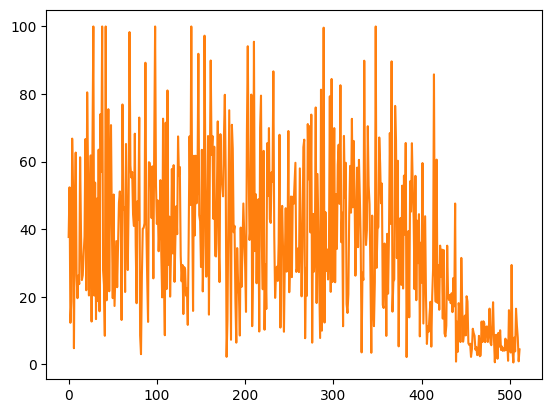

ipdb>  l


      7     noisy_x = torch.normal(x, h_t.unsqueeze(1) ** 0.5)
      8     pred_scores = vectorfield(noisy_x, t)
      9 
     10     estimated_scores = estimate_grad_Rt(noisy_x, t, noise_schedule)
     11     import pdb; pdb.set_trace()
---> 12     estimated_scores = estimated_scores * (h_t + 1e-3).unsqueeze(1)
     13     #estimated_scores = true_grad_Rt(x, t, noise_schedule) * (h_t + 5e-3).unsqueeze(1)
     14     #norm = torch.linalg.vector_norm(estimated_scores, dim=-1)
     15     #print(norm.max())
     16     #max_norm = 100
     17     #clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)



ipdb>  h_t


tensor([4.8922e-06, 9.3060e-06, 1.2951e-11, 2.4535e-03, 6.1049e-05, 4.7635e-03,
        4.2400e-03, 3.7658e-02, 1.1562e-03, 1.1228e-05, 5.6903e-08, 2.2580e-07,
        3.9900e-04, 5.0219e-03, 1.9104e-02, 5.8103e-08, 3.0442e-02, 3.3146e-07,
        3.5132e-02, 5.3690e-11, 4.5482e-04, 5.8402e-04, 1.3709e-03, 3.7570e-07,
        1.4959e-05, 3.0242e-06, 3.2783e-12, 2.2528e-06, 3.9741e-10, 5.7063e-06,
        3.9027e-07, 2.0744e-10, 1.9502e-11, 3.0301e-02, 5.3443e-07, 4.9733e-05,
        4.4418e-10, 3.1177e-05, 6.2199e-07, 1.3448e-07, 5.4471e-07, 3.7383e-11,
        8.0333e-07, 1.3460e-02, 2.7836e-06, 1.5418e-07, 3.7882e-11, 2.2890e-08,
        3.5896e-09, 1.6254e-06, 2.1678e-04, 7.7782e-05, 1.2237e-02, 2.4484e-10,
        1.5594e-09, 2.4608e-03, 2.9802e-09, 6.7149e-09, 8.8860e-09, 6.5044e-06,
        8.6946e-07, 3.5618e-03, 1.0604e-08, 2.8783e-02, 4.9093e-08, 1.2890e-08,
        1.2935e-05, 1.5503e-06, 8.3852e-06, 2.6580e-08, 1.1069e-08, 1.3178e-04,
        1.2970e-03, 2.0825e-02, 2.6843e-

ipdb>  h_t[t.argsort()]


tensor([6.1028e-13, 1.1918e-12, 3.2783e-12, 5.3212e-12, 6.2613e-12, 8.9978e-12,
        9.8292e-12, 1.0921e-11, 1.2815e-11, 1.2951e-11, 1.3601e-11, 1.3684e-11,
        1.9333e-11, 1.9502e-11, 1.9844e-11, 2.1109e-11, 2.2008e-11, 2.3767e-11,
        2.4585e-11, 2.5343e-11, 2.5957e-11, 2.5990e-11, 2.9745e-11, 2.9775e-11,
        3.1299e-11, 3.3541e-11, 3.5996e-11, 3.6786e-11, 3.6799e-11, 3.7383e-11,
        3.7882e-11, 3.8912e-11, 4.3146e-11, 4.9145e-11, 5.0606e-11, 5.3261e-11,
        5.3690e-11, 5.3983e-11, 5.5368e-11, 6.3303e-11, 7.1233e-11, 7.4475e-11,
        7.9250e-11, 8.4397e-11, 8.5541e-11, 9.1380e-11, 9.4523e-11, 9.4967e-11,
        1.0512e-10, 1.0543e-10, 1.0772e-10, 1.2531e-10, 1.3298e-10, 1.4325e-10,
        1.4512e-10, 1.4602e-10, 1.6212e-10, 1.7388e-10, 1.7655e-10, 1.8403e-10,
        2.0744e-10, 2.3132e-10, 2.4484e-10, 2.4553e-10, 2.4564e-10, 2.4801e-10,
        2.5851e-10, 2.6706e-10, 2.6843e-10, 2.8460e-10, 3.5259e-10, 3.5603e-10,
        3.9741e-10, 4.1875e-10, 4.4418e-

ipdb>  l


     18     #estimated_scores = estimated_scores * clip_coef.unsqueeze(-1)
     19 
     20 
     21     return ((estimated_scores - pred_scores)**2) / ((h_t + 1e-3).unsqueeze(1))



ipdb>  n


> /tmp/ipykernel_823549/2294338938.py(21)reward_matching_loss_biased()
     17     #clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
     18     #estimated_scores = estimated_scores * clip_coef.unsqueeze(-1)
     19 
     20 
---> 21     return ((estimated_scores - pred_scores)**2) / ((h_t + 1e-3).unsqueeze(1))



ipdb>  estimated_scores[t.argsort()]


tensor([[-0.0062,  0.0372],
        [-0.0226, -0.0473],
        [ 0.0069,  0.0102],
        ...,
        [-0.1471,  0.2675],
        [-0.0270,  0.0231],
        [ 0.1391,  0.1026]], device='cuda:0', grad_fn=<IndexBackward0>)


ipdb>  plt.plot(torch.linalg.vector_norm(estimated_scores[t.argsort()],dim=-1).detach().cpu()); plt.show()


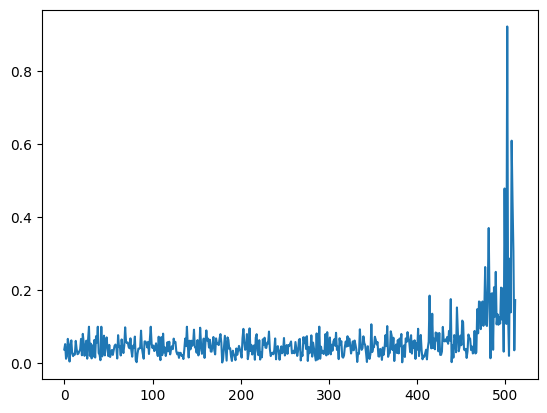

ipdb>  l


     16     #max_norm = 100
     17     #clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
     18     #estimated_scores = estimated_scores * clip_coef.unsqueeze(-1)
     19 
     20 
---> 21     return ((estimated_scores - pred_scores)**2) / ((h_t + 1e-3).unsqueeze(1))



ipdb>  noise_schedule.h(1)


0.039999999984000015


ipdb>  noise_schedule.h(1) * 50 * 50


99.99999996000004


ipdb>  noise_schedule.h(1) * 50 * 50 * 50 * 50


249999.9999000001


ipdb>  noise_schedule.h(1) * 50 * 50 * 50 


4999.999998000002


ipdb>  noise_schedule.sigma_max


0.2


ipdb>  l


ipdb>  predicted_scores


*** NameError: name 'predicted_scores' is not defined


ipdb>  predicted_score


*** NameError: name 'predicted_score' is not defined


ipdb>  l


ipdb>  n


--Return--
tensor([[0.01...DivBackward0>)
> /tmp/ipykernel_823549/2294338938.py(21)reward_matching_loss_biased()
     17     #clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
     18     #estimated_scores = estimated_scores * clip_coef.unsqueeze(-1)
     19 
     20 
---> 21     return ((estimated_scores - pred_scores)**2) / ((h_t + 1e-3).unsqueeze(1))



ipdb>  pred_scores


tensor([[ 0.0102,  0.0112],
        [ 0.0348,  0.0175],
        [ 0.0240, -0.0152],
        ...,
        [-0.0417, -0.0295],
        [ 0.0548,  0.0377],
        [-0.1024,  0.0369]], device='cuda:0', grad_fn=<AddmmBackward0>)


ipdb>  plt.plot(torch.linalg.vector_norm(estimated_scores[t.argsort()],dim=-1).detach().cpu()); plt.show()


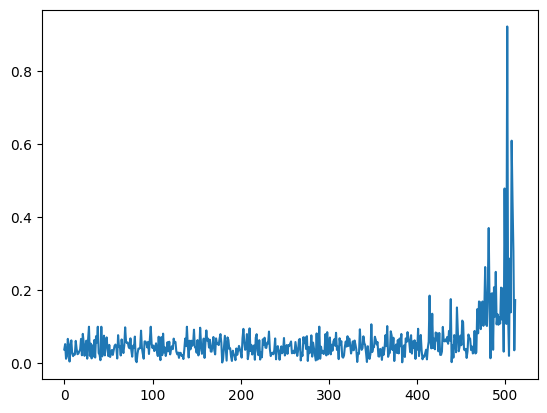

ipdb>  plt.plot(torch.linalg.vector_norm(pred_scores[t.argsort()],dim=-1).detach().cpu()); plt.show()


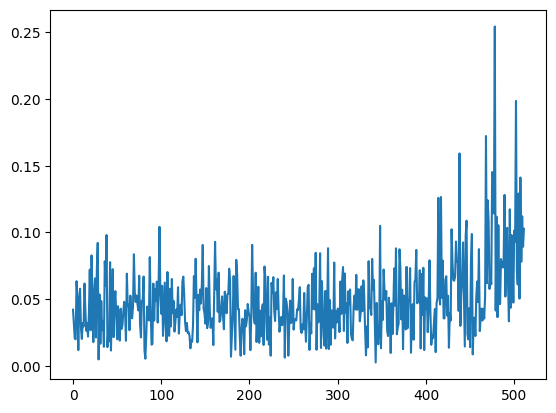

ipdb>  plt.plot(torch.linalg.vector_norm(estimated_scores[t.argsort()],dim=-1).detach().cpu(), label='target'); plt.plot(torch.linalg.vector_norm(pred_scores[t.argsort()],dim=-1).detach().cpu(), label='pred'); plt.legend(); plt.show()


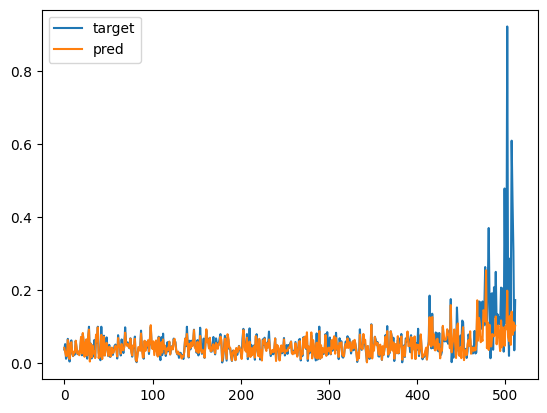

ipdb>  plt.plot(torch.linalg.vector_norm(10 * estimated_scores[t.argsort()],dim=-1).detach().cpu(), label='target'); plt.plot(torch.linalg.vector_norm(pred_scores[t.argsort()],dim=-1).detach().cpu(), label='pred'); plt.legend(); plt.show()


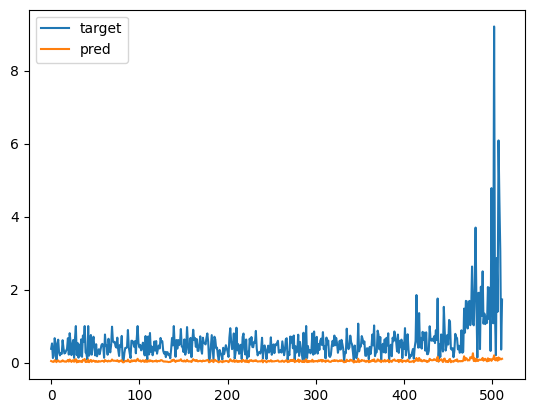

ipdb>  plt.plot(torch.linalg.vector_norm(estimated_scores[t.argsort()],dim=-1).detach().cpu(), label='target'); plt.plot(torch.linalg.vector_norm(pred_scores[t.argsort()],dim=-1).detach().cpu(), label='pred'); plt.legend(); plt.show()


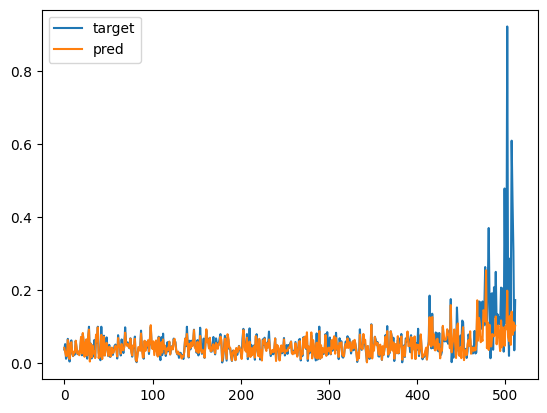

ipdb>  plt.plot(torch.linalg.vector_norm((estimated_scores/(h_t + 1e-3).unsqueeze(1))[t.argsort()],dim=-1).detach().cpu(), label='target'); plt.plot(torch.linalg.vector_norm(pred_scores[t.argsort()],dim=-1).detach().cpu(), label='pred'); plt.legend(); plt.show()


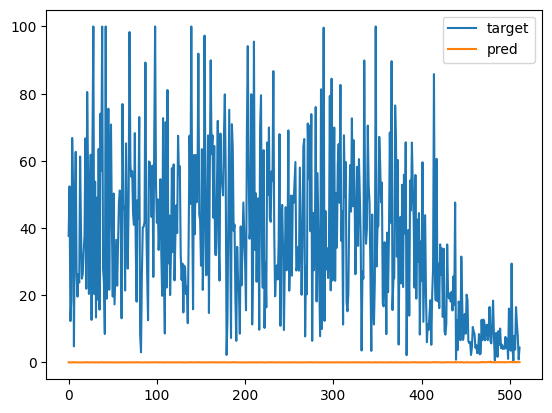

ipdb>  q


  0%|          | 0/10000 [06:20<?, ?it/s]


In [48]:
def score_wrapper(vectorfield):
    def score(x, t, noise_schedule):
        h_t = noise_schedule.h(t)
        #h_t = beta * t
        return vectorfield(x, t) / (h_t + 1e-3).unsqueeze(1)
    
    return score

all_losses = []
binned_losses = [[] for _ in range(10)]
for outer_epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in init_loader:
            samples = samples.to(device)
            opt_vectorfield.zero_grad()
            #t = torch.rand(len(samples), device=device)

            # 80 % sample from (0, 0.1), 20% sample from (0.1, 1)
            # x0 is data
            low_time_t = (-0.1 * torch.rand(len(samples), device=device)) + 0.1
            high_time_t = (-0.9 * torch.rand(len(samples), device=device)) + 1.0
            mask = torch.rand(len(samples), device=device) < 0.9
            t = (low_time_t * mask) + (high_time_t * ~mask)

            #t = LogUniform(torch.tensor(0.001, device=device), torch.tensor(1.0, device=device)).sample((len(samples),))
            t = torch.rand(len(samples), device=device)

            losses = reward_matching_loss_biased(vectorfield, samples, t, noise_schedule) # score_loss(vectorfield, samples, t)
            #losses = score_loss(vectorfield, samples, t)
            loss = losses.mean()
            total_loss += loss.item()
            loss.backward()
            opt_vectorfield.step()
            
            all_losses.append(loss.detach().cpu().item())
            
            for i, loss_bin in enumerate(binned_losses):
                bin_start = i / 20.0
                bin_end = bin_start + 0.05
                
                t_idx = (bin_start <= t) & (t <= bin_end)
                bin_losses = losses[t_idx]
                
                if len(bin_losses) > 0:
                    loss_bin.append(bin_losses.mean().detach().cpu())
                
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))


    # Generate samples using the network
    ve_reverse_sde = VEReverseSDE(score_wrapper(vectorfield), noise_schedule)

    noise = torch.randn_like(x1_samples_normalized) * (beta ** 0.5)
    samples = integrate_sde(ve_reverse_sde, noise, [0, 0.999], 1e-3)[0][-1]
    samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs)).detach()
    # Update Buffer 
    buffer.add(samples, samples_energy)

    if outer_epoch % 10 == 0:
        plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
                     unnormalize(samples, global_mins, global_maxs))
        plt.show()
        
    # Resample data from the buffer
    samples, samples_energy, _ = buffer.sample(512 * 10)
    train_dataset = TensorDataset(samples, samples_energy)
    trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)

Text(0.5, 0, 'epoch')

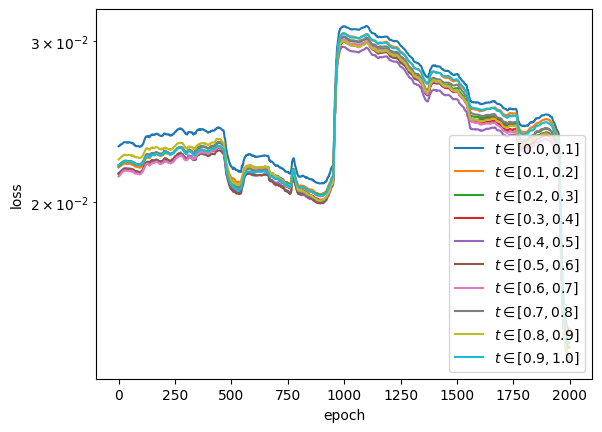

In [109]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w


for i, bin_loss in enumerate(binned_losses):
    plt.plot(moving_average(torch.tensor(bin_loss).cpu().numpy(), 1000)[-2000:], label=r'$t \in [%.1f, %.1f]$' % (i / 10.0, ((i + 1) / 10.0)))
plt.yscale('log')
plt.legend()
plt.ylabel('loss')
plt.xlabel('epoch')

In [110]:
vf_beta = copy.deepcopy(vectorfield.state_dict())

NameError: name 'copy' is not defined

In [111]:
import copy

vf_sqrt_beta = copy.deepcopy(vectorfield.state_dict())

In [238]:
vectorfield.load_state_dict(vf_beta)

<All keys matched successfully>

In [56]:
x1_samples_normalized.repeat(5,1).shape

torch.Size([2560, 2])

### Evaluation

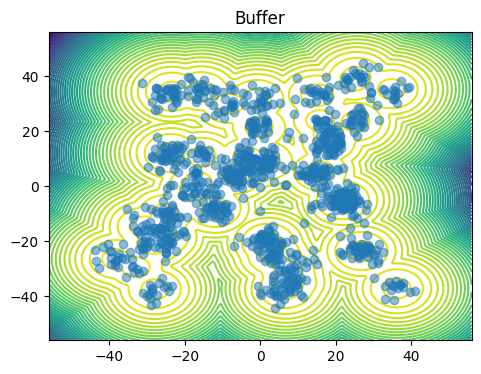

[<Figure size 1200x400 with 1 Axes>]

In [112]:
noise = (torch.randn_like(x1_samples_normalized.repeat(2,1)) * (beta ** 0.5))
samples = integrate_sde(ve_reverse_sde, noise, [0, 0.999], 1e-3)[0][-1]

plot_dataset(unnormalize(samples, global_mins, global_maxs))

In [283]:
beta = 0.2

In [128]:
from torch.func import jacrev

In [129]:
follow_estimate = True
follow_true = False
follow_model = False

In [130]:
def drift(x, t):
    with torch.enable_grad():
        x.requires_grad = True
        #if (t > 0.7).any():
        #    import pdb; pdb.set_trace()
        g_t = noise_schedule.g(t) ** 2
        if follow_estimate:
            f = -0.5 * g_t.unsqueeze(-1) * estimate_grad_Rt_log_trick(x, t, noise_schedule, num_mc_samples=100)
            norm = torch.linalg.vector_norm(f, dim=-1)
            #print(norm.max())
            max_norm = 5
            clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
            f = f * clip_coef.unsqueeze(-1)
        elif follow_true:
            f = - 0.5 * g_t.unsqueeze(-1) * true_grad_Rt(x, t, noise_schedule)
        elif follow_model:
            h_t = noise_schedule.h(t)
            f = - 0.5 * g_t.unsqueeze(-1) * vectorfield(x, t) / (h_t + 1e-3).unsqueeze(1)
            #return f
            norm = torch.linalg.vector_norm(f, dim=-1)
            # print("norm", norm.max())
            max_norm = 10
            clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
            f = f  * clip_coef.unsqueeze(-1)
            # print("clipped norm", torch.linalg.vector_norm(f, dim=-1).max())
    return f

In [131]:
def div_fn(u):
    """Accepts a function u:R^D -> R^D."""
    J = jacrev(u)
    def div(x):
        return torch.trace(J(x.unsqueeze(0)).squeeze())
    return div

def output_and_div(vecfield, x):
    if follow_estimate:
        dx = vecfield(x)
        #dx = torch.vmap(vecfield, randomness="different")(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x)
    elif follow_true:
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x.clone().detach().requires_grad_(True))
    elif follow_model:
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x)
    return dx, div

In [132]:
def prior_dist(beta):
    dist = torch.distributions.MultivariateNormal(
        torch.zeros(2).to(device), torch.eye(2).to(device) * beta
    )
    return dist

In [133]:
reverse_time = False

In [134]:
unnorm_test_samples = target.sample((init_num_samples,)).to(device).detach()

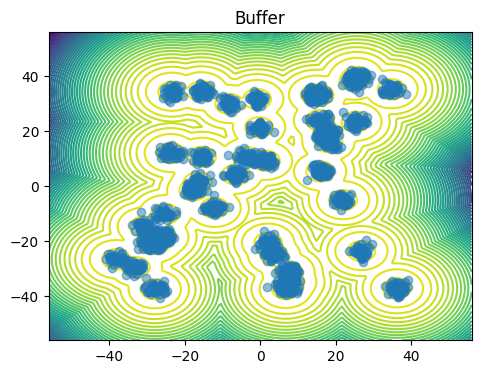

[<Figure size 1200x400 with 1 Axes>]

In [294]:
plot_dataset(unnorm_test_samples)

In [136]:
def odefunc(t, x_in):
    x = x_in[..., :-1].clone().detach().requires_grad_(True)
    t = t.to(device)
    vecfield = lambda x: drift(x, t)
    if True:#follow_model or follow_estimate:
        def vecfield(x):
            return drift(x, torch.ones(x.shape[0]).to(device) * t)
    dx, div = output_and_div(vecfield, x)
    div = div.reshape(-1, 1)
    return torch.cat([dx, div], dim=-1)

In [137]:
follow_model = False
follow_estimate = False
follow_true = True
with torch.no_grad():
    if reverse_time:
        x1 = torch.randn(1024, 2).to(device) * np.sqrt(beta)
        time = torch.linspace(1, 0, 1000).to(device)
    else:
        x1 = unnorm_test_samples
        #x1, _, _ = normalize(unnorm_test_samples)
        time = torch.linspace(0, 1, 1000).to(device)
    state1 = torch.cat([x1, torch.zeros_like(x1[..., :1])], dim=-1)
    state1.requires_grad = True
    states_traj = odeint(odefunc, state1, t=time, method="euler")
    state0 = states_traj[-1]

    x0, logdetjac = state0[..., :-1], state0[..., -1]
    p0 = prior_dist(noise_schedule.h(1))#((noise_schedule.h(1) * (50 ** 2)) ** 0.5) * 50 * 50)
    logp0 = p0.log_prob(x0)#unnormalize(x0, global_mins, global_maxs))
    logp1 = -(logp0 + logdetjac)

In [429]:
((beta * 50 * 50) ** 0.5) * 50 * 50

999.9999999500002

In [138]:
print("logp0", logp0.mean())
print("logdetjac", logdetjac.mean())
print("logp1", logp1.mean())

logp0 tensor(-10.5823, device='cuda:0')
logdetjac tensor(0., device='cuda:0')
logp1 tensor(10.5823, device='cuda:0')


In [258]:
log_p0_true = true_Rt(prior_samples, torch.tensor(1).to(device), beta)
print("logp0 true: ", log_p0_true.mean())

AttributeError: 'float' object has no attribute 'h'

In [530]:
log_p0_true = true_Rt(x0, torch.tensor(1).to(device), beta)
print("logp0 true: ", log_p0_true.mean())

logp0 true:  tensor(-9.7362, device='cuda:0')


In [531]:
-(log_p0_true + logdetjac).mean()

tensor(7.3265, device='cuda:0')

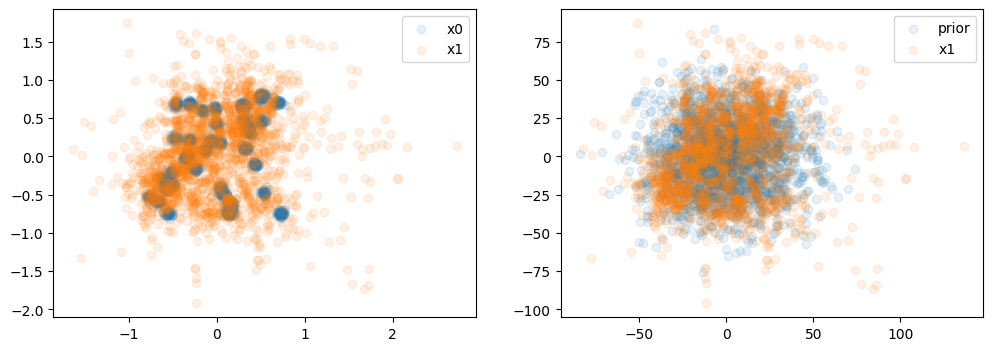

In [427]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].scatter(x1[:, 0].detach().cpu(), x1[:, 1].detach().cpu(), alpha=0.1, label="x0")
ax[0].scatter(x0[:, 0].detach().cpu(), x0[:, 1].detach().cpu(), alpha=0.1, label="x1")


prior_samples = p0.sample((2048,))
if reverse_time:
    ax[0].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.2, label="prior")
    ax[1].scatter(samples[:, 0].detach().cpu(), samples[:, 1].detach().cpu(), alpha=0.1, label="generated samples")
else:
    ax[1].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.1, label="prior")
ax[0].legend()

x0_unnormalized = unnormalize(x0, global_mins, global_maxs)
ax[1].scatter(x0_unnormalized[:, 0].detach().cpu(), x0_unnormalized[:, 1].detach().cpu(), alpha=0.1, label="x1")
ax[1].legend()
#ax[0].set_xlim(-2,2)
#ax[0].set_ylim(-2,2)
#plt.xlim(-2, 2)
#plt.ylim(-2, 2)
plt.show()

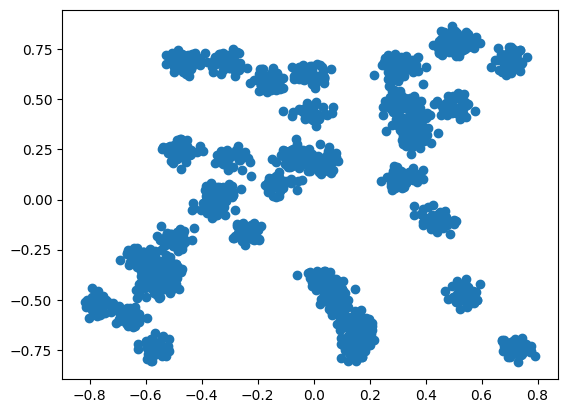

In [138]:
plt.scatter(*states_traj[-1, :, :2].T.cpu())

In [134]:
states_traj[1].shape

torch.Size([2048, 3])

In [1]:
x0.abs().mean(1).argmax()

NameError: name 'x0' is not defined

In [ ]:
x0[702]

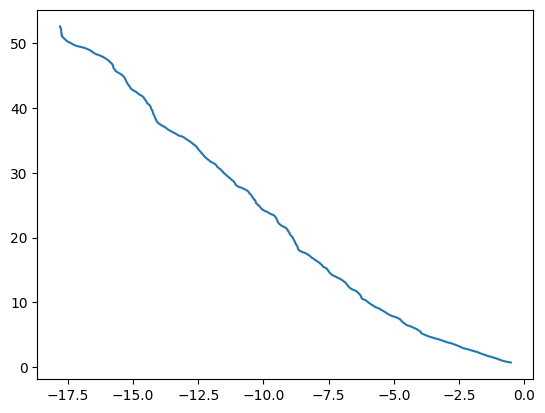

In [94]:
plt.plot(states_traj[:, 702, 0].cpu(), states_traj[:, 702, 1].cpu())

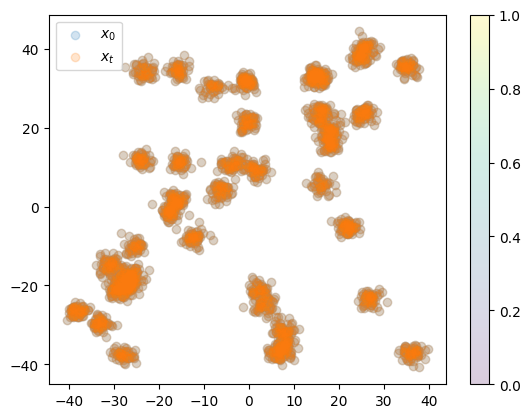

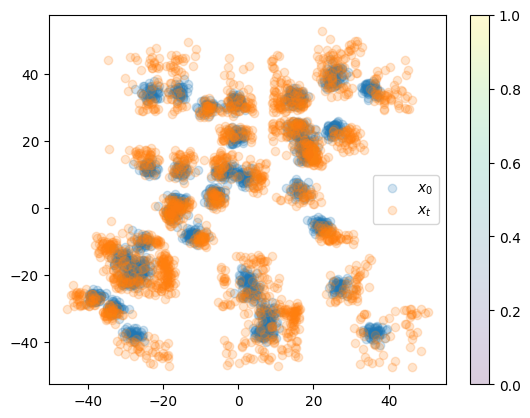

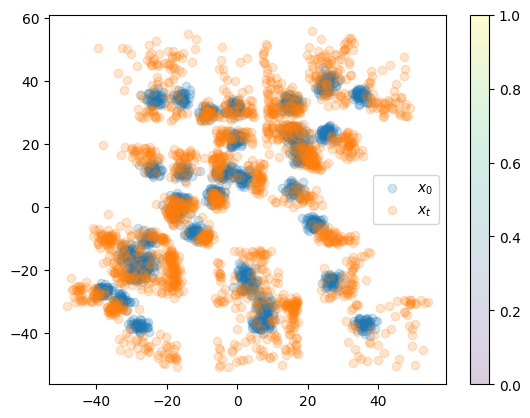

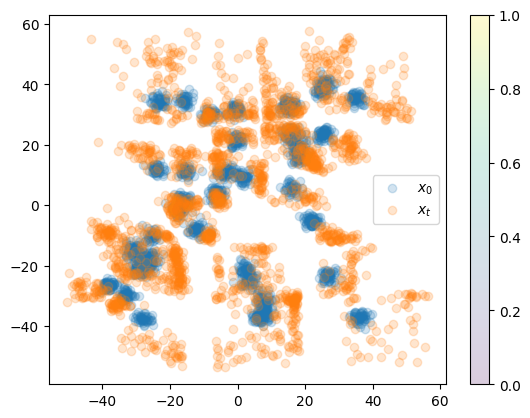

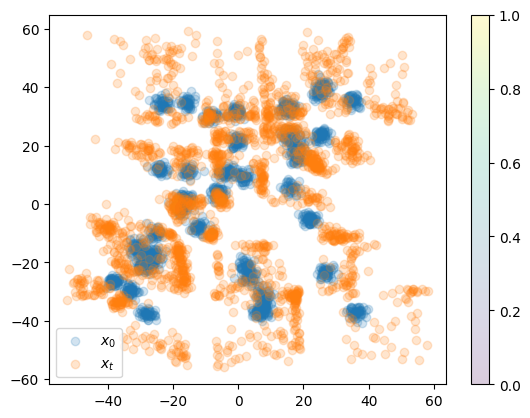

...

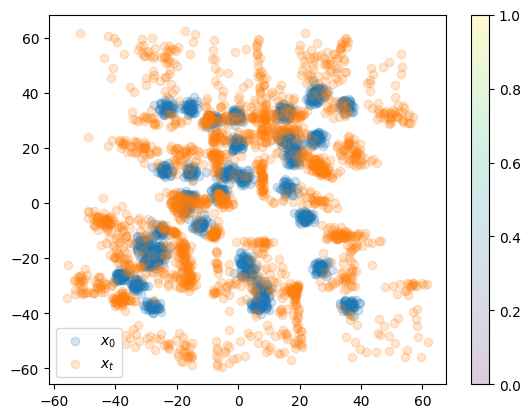

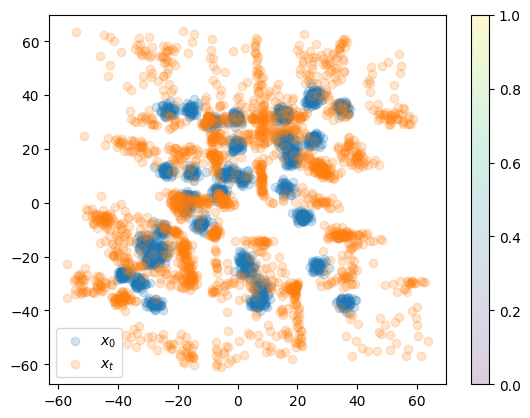

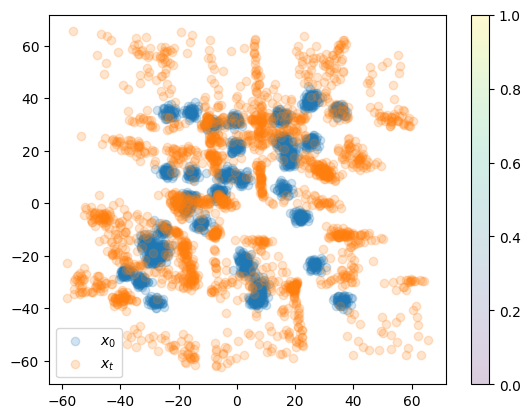

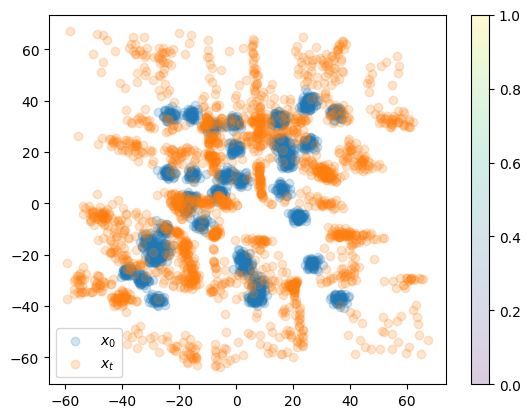

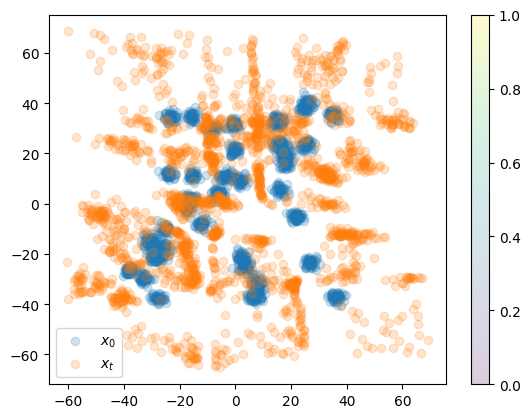

In [503]:
plot_traj = unnormalize(states_traj, global_mins, global_maxs)


for i in range(0, plot_traj.shape[0], 99):
    t = i / float(len(plot_traj))
        
    plt.scatter(plot_traj[0, :, 0].cpu(), plot_traj[0,:,1].cpu(), alpha=0.2, label=r'$x_0$')
    plt.scatter(plot_traj[i, :, 0].cpu(), plot_traj[i,:,1].cpu(), alpha=0.2, label=r'$x_t$')
        
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    
    X = torch.linspace(x_min, x_max, num_grid)
    Y = torch.linspace(y_min, y_max, num_grid)

    # create a grid of (x,y) coordinates
    x = torch.meshgrid(X, Y)

    # make x into tensor
    x = torch.stack(x, dim=2).reshape(-1, 2)
    x = x.to(device)
    #x.requires_grad = True
    
    x = normalize(x)[0]
    vf = drift(x, torch.full((len(x),), fill_value=t, device=device))
    #plt.imshow(vf.reshape(num_grid, num_grid, 2)[..., 1].detach().cpu(), extent=[x_min, x_max, y_min, y_max])

    plt.colorbar()
    plt.legend()

    #plt.ylim(-100, 100)
    plt.show()

In [ ]:
norms = []
learned_norms = []
estimated_norms = []
raw_pred_norms = []
for t in tqdm(torch.linspace(0.0, 1.0, 100)):
    num_grid = 100
    X = torch.linspace(-1, 1, num_grid)
    Y = torch.linspace(-1, 1, num_grid)

    # create a grid of (x,y) coordinates
    x = torch.meshgrid(X, Y)

    # make x into tensor
    x = torch.stack(x, dim=2).reshape(-1, 2)
    x = x.to(device)
    x.requires_grad = True

    t = t.unsqueeze(0)

    h_t = noise_schedule.h(t)

    true = true_grad_Rt(x, t, noise_schedule, var_exploding=True).detach()
    stochastic_estimate = torch.cat([
        estimate_grad_Rt(x.to(device), t.repeat(len(x)).to(device), noise_schedule, num_mc_samples=100).detach().unsqueeze(0)
        for _ in range(10)
    ]).mean(0)
    unaltered_predicted = vectorfield(x.to(device), t.repeat(len(x)).to(device)).cpu().detach()
    predicted = unaltered_predicted / (1e-3 + h_t)

    norms.append(torch.linalg.norm(true, dim=-1).mean())
    learned_norms.append(torch.linalg.norm(predicted, dim=-1).mean())
    raw_pred_norms.append(torch.linalg.norm(unaltered_predicted, dim=-1).mean())
    estimated_norms.append(torch.linalg.norm(stochastic_estimate, dim=-1).mean())

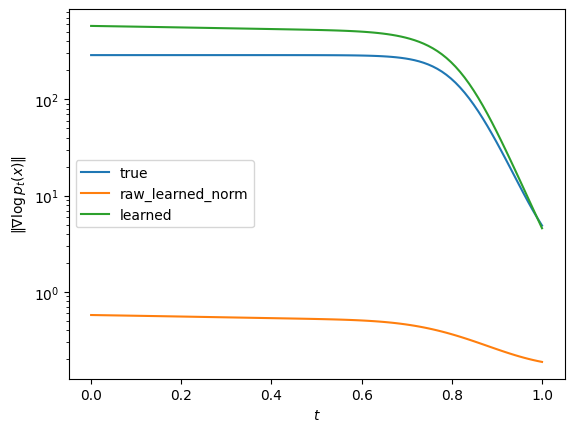

In [197]:
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(norms), label='true')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(raw_pred_norms), label='raw_learned_norm')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(learned_norms), label='learned')
plt.legend()
plt.xlabel(r'$t$')
plt.ylabel(r'$\|\nabla \log p_t(x)\|$')
plt.yscale('log')

In [208]:
torch.tensor(raw_pred_norms)[0]

tensor(0.1880)

ValueError: x and y must have same first dimension, but have shapes torch.Size([100]) and torch.Size([0])

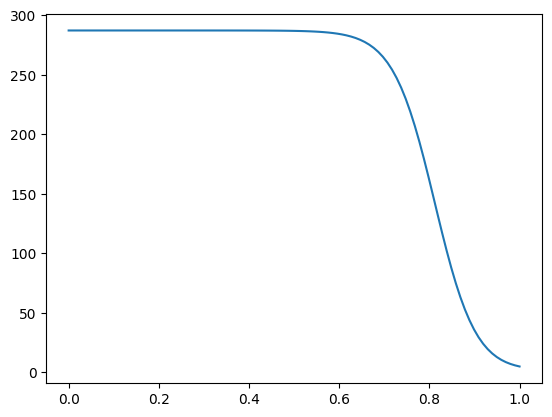

In [194]:
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(norms), label='true')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(estimated_norms), label='estimated')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(learned_norms), label='learned')
plt.legend()
plt.xlabel(r'$t$')
plt.ylabel(r'$\|\nabla \log p_t(x)\|$')
plt.yscale('log')

In [408]:
torch.tensor(norms)

tensor([287.0571, 278.8618, 271.1163,  ...,   1.7711,   1.7710,   1.7710])

In [179]:
num_grid = 100
X = torch.linspace(-1, 1, num_grid)
Y = torch.linspace(-1, 1, num_grid)

# create a grid of (x,y) coordinates
x = torch.meshgrid(X, Y)

# make x into tensor
x = torch.stack(x, dim=2).reshape(-1, 2)
x = x.to(device)
x.requires_grad = True

t = torch.rand(1, device=device)
t = t * 0 + 0.01

num_mc_samples = 100

In [180]:
beta * t

tensor([0.0020], device='cuda:0')

In [181]:
h_t = noise_schedule.h(t)

true = true_grad_Rt(x, t, noise_schedule, var_exploding=True).detach()
predicted = (vectorfield(x, t.repeat(len(x))) / (1e-3 + h_t).unsqueeze(1)).cpu().detach()
stochastic_estimate = torch.cat([
    estimate_grad_Rt(x, t.repeat(len(x)), noise_schedule, num_mc_samples=100).detach().unsqueeze(0)
    for _ in tqdm(range(10))
]).mean(0)

100%|██████████| 10/10 [00:00<00:00, 23.94it/s]


In [182]:
print(predicted * (5e-3 + h_t.cpu()))
print(predicted)

tensor([[ 4.6234,  5.1902],
        [ 4.7529,  4.9664],
        [ 4.9414,  4.6364],
        ...,
        [-5.1281, -2.8096],
        [-5.2648, -3.0411],
        [-5.3885, -3.2749]])
tensor([[  924.6860,  1038.0491],
        [  950.5867,   993.2897],
        [  988.2816,   927.2836],
        ...,
        [-1025.6222,  -561.9300],
        [-1052.9696,  -608.2216],
        [-1077.6980,  -654.9872]])


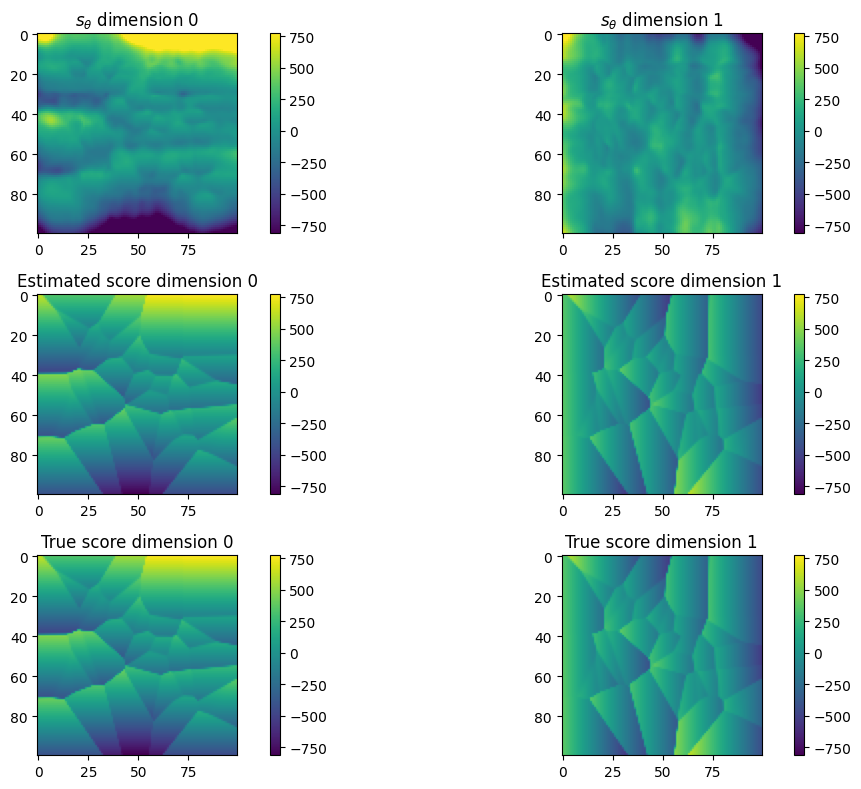

In [183]:
fig, axs = plt.subplots(3, 2, figsize=(12, 8))

vmin = true.min()
vmax = true.max()

im = axs[0,0].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,0])
axs[0,0].set_title(r'$s_\theta$ dimension 0')

im = axs[0,1].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,1])
axs[0,1].set_title(r'$s_\theta$ dimension 1')
#del grad_Rt
#del grads_Rt

im = axs[1,0].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,0])
axs[1,0].set_title(r'Estimated score dimension 0')

im = axs[1,1].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,1])
axs[1,1].set_title(r'Estimated score dimension 1')

im = axs[2,0].imshow(true.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,0])
axs[2,0].set_title(r'True score dimension 0')

im = axs[2,1].imshow(true.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,1])
axs[2,1].set_title(r'True score dimension 1')
#del grad_Rt
#del grads_Rt

plt.tight_layout()
plt.show()

In [163]:
import gc
torch.cuda.empty_cache()
gc.collect()

27384

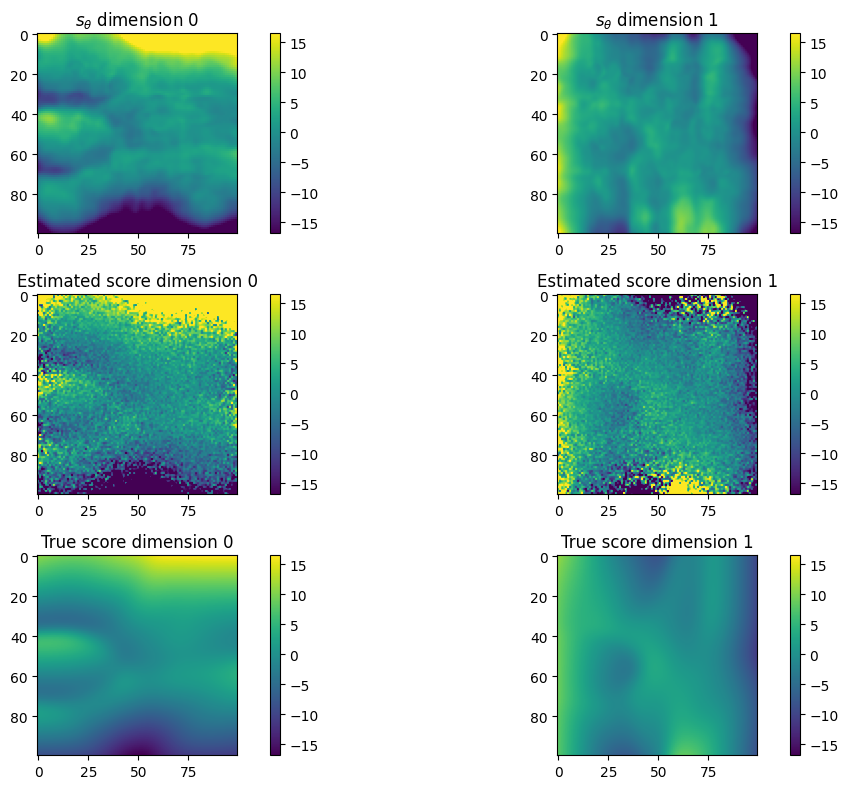

In [164]:
fig, axs = plt.subplots(3, 2, figsize=(12, 8))

vmin = true.min()
vmax = true.max()

im = axs[0,0].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,0])
axs[0,0].set_title(r'$s_\theta$ dimension 0')

im = axs[0,1].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,1])
axs[0,1].set_title(r'$s_\theta$ dimension 1')
#del grad_Rt
#del grads_Rt

im = axs[1,0].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,0])
axs[1,0].set_title(r'Estimated score dimension 0')

im = axs[1,1].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,1])
axs[1,1].set_title(r'Estimated score dimension 1')

im = axs[2,0].imshow(true.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,0])
axs[2,0].set_title(r'True score dimension 0')

im = axs[2,1].imshow(true.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,1])
axs[2,1].set_title(r'True score dimension 1')
#del grad_Rt
#del grads_Rt

plt.tight_layout()
plt.show()

In [71]:
samples = torch.randn((1000, 2)) * (20)

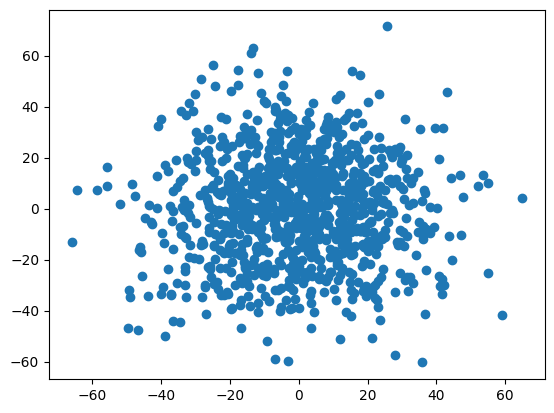

In [72]:
plt.scatter(*samples.T)

In [73]:
20**2

400

In [19]:
def plot_score_norms(noise_schedule, num_mc_samples=100):
    samples = normalize(target.sample((2048,)))[0]
    times = torch.linspace(0, 1, 20, device=device)
    
    mean_norms, std_norms = [], []
    for t in tqdm(times, position=0, leave=True):
        h_t = noise_schedule.h(t).unsqueeze(0)

        # noisy sample: x(t)
        noisy_x = torch.normal(samples, h_t.unsqueeze(1) ** 0.5)
        estimated_score = torch.cat([
            estimate_grad_Rt(noisy_x, t.repeat(len(noisy_x)), noise_schedule, num_mc_samples=num_mc_samples).detach().unsqueeze(0)
            for _ in range(10)
            #for _ in tqdm(range(10))
        ]).mean(0)# / ( 10 + h_t).unsqueeze(1)
        
        norms = torch.linalg.vector_norm(estimated_score, dim=-1)
        
        mean_norms.append(norms.mean())
        std_norms.append(norms.std())
        
    plt.scatter(*noisy_x.detach().cpu().T)
    plt.show()
        
    mean_norms = torch.tensor(mean_norms).cpu()
    std_norms = torch.tensor(std_norms).cpu()
    
    plt.plot(times.cpu(), mean_norms)
    plt.fill_between(times.cpu(), mean_norms - std_norms, mean_norms + std_norms, alpha=0.4)
    
    plt.xlabel(r'$t$')
    plt.ylabel(r"$\|\nabla \log E[R(x')]\|_2^2$")
    #plt.yscale('log')
    plt.show()
    
    return mean_norms

In [40]:
from torch.distributions.multivariate_normal import MultivariateNormal

class BaseProposalDistribution(ABC):
    @abstractmethod
    def update(self, x):
        '''Updates the proposal according to new samples x'''
        pass
    
    @abstractmethod
    def sample(self, t, num_samples: int = 100):
        pass
    
    @abstractmethod
    def log_prob(self, x, t):
        pass
    
class DummyProposalDistribution(BaseProposalDistribution):
    def __init__(self, noise_schedule):
        self.noise_schedule = noise_schedule
        self.centers = None
        
    def update(self, xt):
        self.centers = xt
        
    def sample(self, t, num_samples: int = 100):
        repeated_x = self.centers.unsqueeze(0).repeat_interleave(num_samples, dim=0)
        repeated_t = t.unsqueeze(0).repeat_interleave(num_samples, dim=0)

        h_t = noise_schedule.h(repeated_t)
        h_t = h_t.unsqueeze(1)
        
        return repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
        
    def log_prob(self, x, t):
        log_probs = torch.zeros(x.shape[:2], device=x.device)
        if x.ndim == 2:
            distrib = MultivariateNormal(
                self.centers, 
                (noise_schedule.h(t) + 1e-6) * torch.eye(x.shape[-1], device=x.device),
                validate_args=False
            )
            
            log_probs = distrib.log_prob(x)
        
        else:
            for i in range(x.shape[x.ndim - 1]):
                distrib = MultivariateNormal(
                    self.centers[i], 
                    (noise_schedule.h(t) + 1e-6) * torch.eye(x.shape[-1], device=x.device)
                )

                log_probs[:, i] = distrib.log_prob(x[:, i])
            
        return log_probs
    
class X0CenteredProposalDistribution(DummyProposalDistribution):
    def __init__(self, noise_schedule, x0, theta: float = 1.0):
        super().__init__(noise_schedule)
        
        assert 0.0 <= theta and theta <= 1.0
        self.theta = theta
        self.centers = x0
    
    def update(self, xt):
        self.centers = (self.theta * self.centers) + ((1 - self.theta) * xt)
            

In [216]:
centers = torch.tensor([[0.,1.],[1.,0.]])

In [71]:
import copy

AVAILABLE_LINE_STYLES = ['solid', 'dashed', 'dotted', (0, (1, 1))]
AVAILABLE_COLORS = ['blue', 'orange', 'green', 'red']

def true_grad_Rt(x, t, noise_schedule, var_exploding=True):
    samples_energy = true_Rt(x, t[0], noise_schedule, var_exploding=var_exploding)
    true_scores = torch.autograd.grad(samples_energy.sum(), x, retain_graph=True)[0].detach()
    return true_scores

def plot_bias_variance_forward_trajs(
    noise_schedule, 
    num_mc_samples_to_try=[100],
    num_replicates=10, 
    num_points=256, 
    log_scale=False
):
    #samples = normalize(target.sample((num_points,)))[0]
    samples = target.sample((num_points,))
    times = torch.linspace(0, 1, 20, device=device)
    
    noisy_xs = []
    fig, ax = plt.subplots()

    methods = {False: estimate_grad_Rt, True: estimate_grad_Rt_log_trick}
    for do_jensen in [True]:#, True]:
        mean_bias_norms = {mc_samps: [] for mc_samps in num_mc_samples_to_try}
        mean_var_norms = copy.deepcopy(mean_bias_norms)
        mean_grad_norms = copy.deepcopy(mean_bias_norms)
        mean_baseline_var_norms = copy.deepcopy(mean_bias_norms)
        for t in tqdm(times, position=0, leave=True):
            h_t = noise_schedule.h(t).unsqueeze(0)

            # noisy sample: x(t)
            noisy_x = torch.normal(samples, h_t.unsqueeze(1) ** 0.5)
            noisy_xs.append(noisy_x.detach().cpu())
            #plt.scatter(*noisy_x.detach().cpu().T)
            #plt.show()

            true_score = true_grad_Rt(
                noisy_x.requires_grad_(), 
                t.expand(len(noisy_x)), 
                noise_schedule
            )

            for num_mc_samples in num_mc_samples_to_try:
                estimated_score = torch.cat([
                    methods[do_jensen](
                        noisy_x,
                        t.repeat(len(noisy_x)),
                        noise_schedule,
                        num_mc_samples=num_mc_samples,
                        #orig_x=samples if do_is else None
                    ).detach().unsqueeze(0)
                    for _ in range(num_replicates)
                ])

                print((estimated_score.mean(0) / true_score).mean() / noise_schedule.h(t))
                mean_bias_norm = torch.linalg.vector_norm(
                    estimated_score.mean(dim=0) - true_score, 
                    dim=-1
                ).mean()

                norms = torch.linalg.vector_norm(estimated_score, dim=-1)
                mean_var_norm = norms.var(0).mean()

                baseline_score = estimated_score.mean(0)
                baseline_var = torch.linalg.vector_norm(estimated_score - baseline_score.unsqueeze(0), dim=-1).var(0).mean()

                mean_bias_norms[num_mc_samples].append(mean_bias_norm.detach().cpu())
                mean_var_norms[num_mc_samples].append(mean_var_norm.detach().cpu())
                mean_grad_norms[num_mc_samples].append(norms.mean().detach().cpu())
                mean_baseline_var_norms[num_mc_samples].append(baseline_var.detach().cpu())

        for i, num_mc_samples in enumerate(num_mc_samples_to_try):
            bias_norms = torch.tensor(mean_bias_norms[num_mc_samples])
            var_norms = torch.tensor(mean_var_norms[num_mc_samples])
            grad_norms = torch.tensor(mean_grad_norms[num_mc_samples])
            baseline_var_norms = torch.tensor(mean_baseline_var_norms[num_mc_samples])

            is_str = f'{"LSE" if not do_jensen else "Jensen"} estimate'
            ax.plot(
                times.cpu(), 
                bias_norms, 
                label=f'Bias {is_str} -- Num MC Samples = {num_mc_samples}',
                linestyle=AVAILABLE_LINE_STYLES[i + int(do_jensen)],
                c=AVAILABLE_COLORS[0]
            )

            ax.plot(
                times.cpu(), 
                var_norms, 
                label=f'Variance {is_str} -- Num MC Samples = {num_mc_samples}',
                linestyle=AVAILABLE_LINE_STYLES[i + int(do_jensen)],
                c=AVAILABLE_COLORS[1]
            )

            #ax.plot(
            #    times.cpu(), 
            #    baseline_var_norms, 
            #    label=f'Baseline adjusted variance -- Num MC Samples = {num_mc_samples}',
            #    linestyle=AVAILABLE_LINE_STYLES[i],
            #    c=AVAILABLE_COLORS[3]
            #)

            #ax.plot(
            #    times.cpu(), 
            #    grad_norms, 
            #    label=f'Grad norms {is_str} -- Num MC Samples = {num_mc_samples}',
            #    linestyle=AVAILABLE_LINE_STYLES[i + int(do_jensen)],
            #    c=AVAILABLE_COLORS[2]
            #)
    
    ax.set_xlabel(r'$t$')
    
    handles, labels = ax.get_legend_handles_labels()
    # sort both labels and handles by labels
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
    #ax.set_xlim(0.9, 1.0)
    #ax.set_ylim(0,90)
    
    if log_scale:
        ax.set_yscale('log')
        
    ax.set_title(r'Bias and variance following true forward trajectories starting at $p_0$ samples')
    plt.show()
    
    return torch.stack(noisy_xs)

In [72]:
# ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
#noise_schedule = LinearNoiseSchedule(torch.tensor(50), 1)
noise_schedule = GeometricNoiseSchedule(0.01, 500, 1)

In [73]:
noise_schedule.h(1)

249999.99989999997

 20%|██        | 4/20 [00:00<00:01, 15.06it/s]

tensor(nan, device='cuda:0')
tensor(10925.7158, device='cuda:0')
tensor(2000.1740, device='cuda:0')
tensor(-484.5063, device='cuda:0')


 30%|███       | 6/20 [00:00<00:00, 14.92it/s]

tensor(107.1035, device='cuda:0')
tensor(34.8183, device='cuda:0')
tensor(11.1524, device='cuda:0')


 50%|█████     | 10/20 [00:00<00:00, 14.35it/s]

tensor(3.3090, device='cuda:0')
tensor(1.0915, device='cuda:0')
tensor(0.3632, device='cuda:0')


 60%|██████    | 12/20 [00:00<00:00, 14.35it/s]

tensor(0.1212, device='cuda:0')
tensor(0.0375, device='cuda:0')
tensor(0.0111, device='cuda:0')


 80%|████████  | 16/20 [00:01<00:00, 14.64it/s]

tensor(0.0036, device='cuda:0')
tensor(0.0012, device='cuda:0')
tensor(0.0003, device='cuda:0')
tensor(0.0001, device='cuda:0')


100%|██████████| 20/20 [00:01<00:00, 14.68it/s]

tensor(2.7456e-05, device='cuda:0')
tensor(5.0978e-06, device='cuda:0')
tensor(7.7705e-07, device='cuda:0')


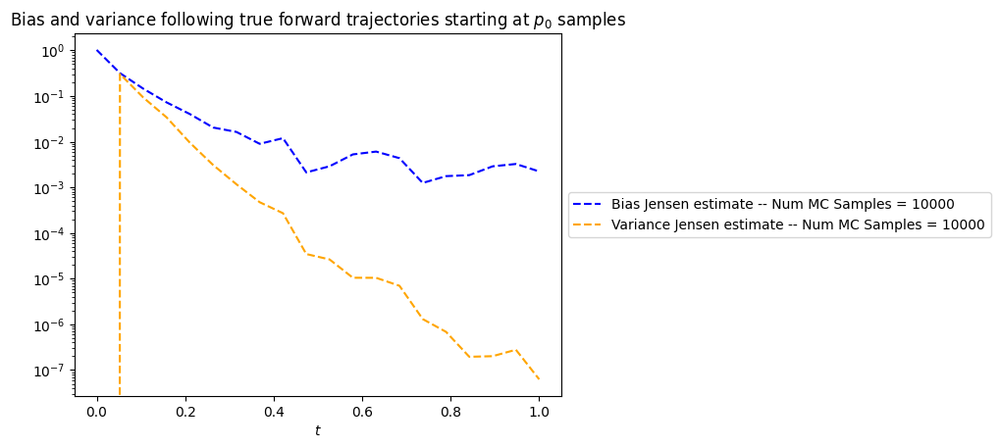

In [74]:
noisy_xs = plot_bias_variance_forward_trajs(noise_schedule, num_mc_samples_to_try=[10000], num_replicates=10, num_points=16, log_scale=True)

 10%|█         | 2/20 [00:00<00:02,  8.16it/s]

tensor(nan, device='cuda:0')
tensor(6384.5063, device='cuda:0')


 20%|██        | 4/20 [00:00<00:01,  8.20it/s]

tensor(1880.3312, device='cuda:0')
tensor(816.1344, device='cuda:0')


 30%|███       | 6/20 [00:00<00:01,  8.29it/s]

tensor(305.7227, device='cuda:0')
tensor(128.0332, device='cuda:0')


 40%|████      | 8/20 [00:00<00:01,  8.30it/s]

tensor(54.2896, device='cuda:0')
tensor(21.2877, device='cuda:0')


 50%|█████     | 10/20 [00:01<00:01,  8.31it/s]

tensor(9.2022, device='cuda:0')
tensor(3.9915, device='cuda:0')


 60%|██████    | 12/20 [00:01<00:00,  8.34it/s]

tensor(1.6157, device='cuda:0')
tensor(0.6717, device='cuda:0')


 70%|███████   | 14/20 [00:01<00:00,  8.18it/s]

tensor(0.2845, device='cuda:0')
tensor(0.1130, device='cuda:0')


 80%|████████  | 16/20 [00:01<00:00,  8.23it/s]

tensor(0.0471, device='cuda:0')
tensor(0.0205, device='cuda:0')


 90%|█████████ | 18/20 [00:02<00:00,  8.25it/s]

tensor(0.0088, device='cuda:0')
tensor(0.0036, device='cuda:0')


100%|██████████| 20/20 [00:02<00:00,  8.24it/s]

tensor(0.0015, device='cuda:0')
tensor(0.0006, device='cuda:0')


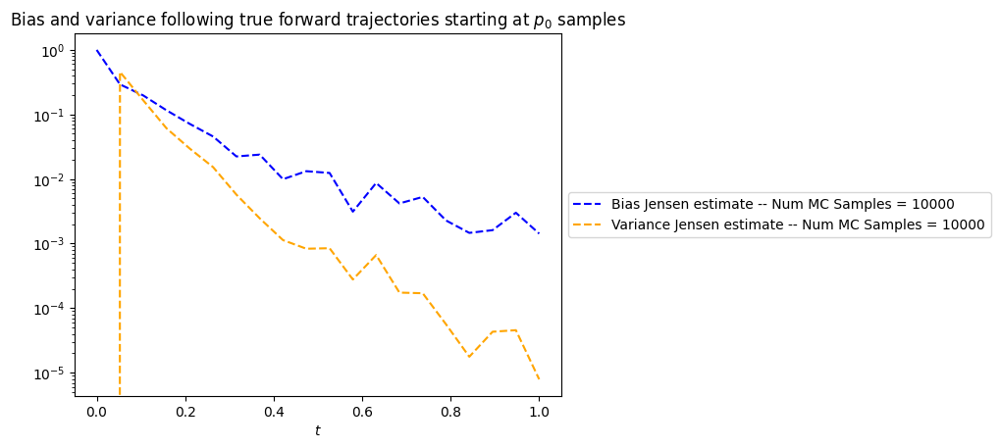

In [92]:
noisy_xs = plot_bias_variance_forward_trajs(noise_schedule, num_mc_samples_to_try=[10000], num_replicates=10, num_points=16, log_scale=True)

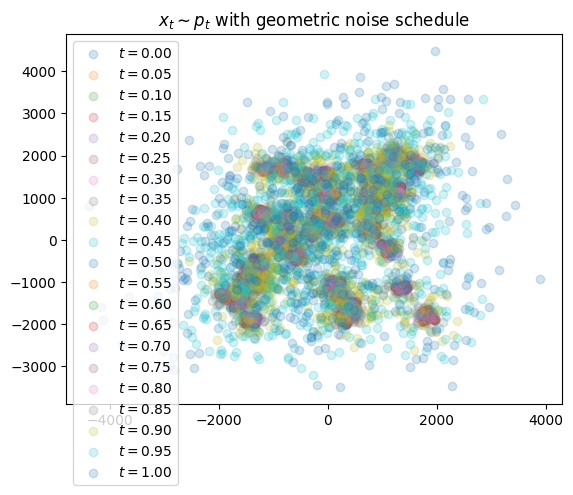

In [180]:
noisy_xs = unnormalize(noisy_xs, -50, 50)
alpha = 0.2
to_plot = noisy_xs[::2]
for i in range(len(to_plot)):
    plt.scatter(*to_plot[i].T, alpha=alpha, label=r'$t={:.2f}$'.format(float(i) / len(to_plot)))
    
plt.scatter(*noisy_xs[-1].T, alpha=alpha, label=r'$t=1.00$')
plt.legend()
plt.title(r'$x_t \sim p_t$ with geometric noise schedule')
plt.show()
#noisy_xs[::4]

In [95]:
noisy_xs[0].max()

tensor(0.8583)

100%|██████████| 20/20 [00:01<00:00, 19.43it/s]


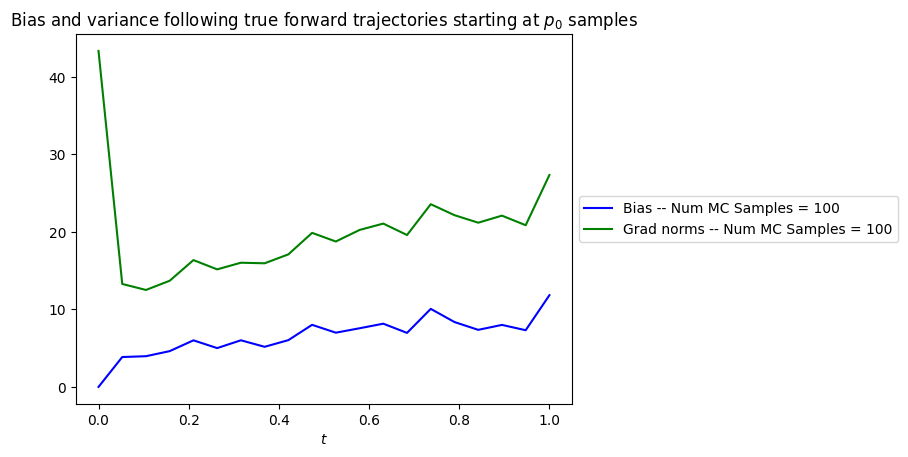

In [174]:
plot_bias_variance_forward_trajs(noise_schedule)

100%|██████████| 20/20 [00:02<00:00,  7.87it/s]


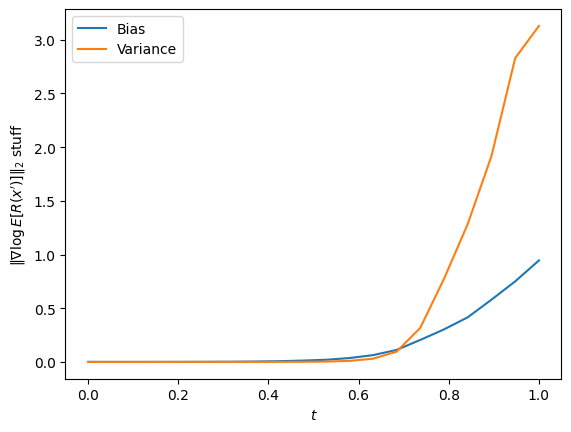

In [35]:
plot_bias_variance_forward_trajs(noise_schedule, num_mc_samples=1000)

In [42]:
import gc
torch.cuda.empty_cache()
gc.collect()

10041

## ELBO NLL Computation

From the ML diffusion paper from Durkin and Song it's shown that $-\log p_\theta^{SDE}(x) \leq \mathcal{L}_\theta^{DSM}(x)$ where $\mathcal{L}_\theta^{DSM}(x)$ is equal to

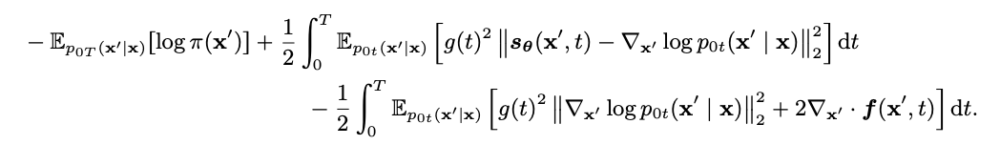

which is nice since the divergence of $f$ drops out with the VE SDE.  The variance of the estimator could be too high in which case we might need to use some importance sampling.

For reference, assuming $p_{0t}(x|x_0) =\mathcal{N}(x;x_0, h(t))$ we have $\nabla_x p_{0t}(x|x_0) = -\frac{x-x_0}{h(t)}$

In [9]:
import math

def compute_expected_noise_time_nll(
    eval_points,
    noise_schedule,
    num_mc_samples
):
    h_t = noise_schedule.h(1) * (noise_schedule.norm_factor ** 2)
    
    repeated_x = eval_points.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    noisy_x = repeated_x + (torch.randn_like(repeated_x) * (h_t ** 0.5))
    
    prior = prior_dist(h_t)
    prior_nll = prior.log_prob(noisy_x)
    
    return prior_nll.mean(dim=0)

def ve_nll_integrand(
    time,
    noise_schedule,
    eval_points,
    score_function,
    num_mc_samples=100
):
    time = time.unsqueeze(0).unsqueeze(1)
    g_t = noise_schedule.g(time) * (noise_schedule.norm_factor)
    h_t = noise_schedule.h(time)# * (noise_schedule.norm_factor ** 2)
    
    repeated_x = normalize(
        eval_points.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0),
        mins=-noise_schedule.norm_factor,
        maxs=noise_schedule.norm_factor
    )[0]
    noisy_x = repeated_x + (torch.randn_like(repeated_x) * h_t.sqrt())
        
    conditional_score = -(
        unnormalize(noisy_x, -noise_schedule.norm_factor, noise_schedule.norm_factor) - 
        unnormalize(repeated_x, -noise_schedule.norm_factor, noise_schedule.norm_factor)
    ) / (h_t * (noise_schedule.norm_factor ** 2))
    score = score_function(noisy_x, time)
    
    diff_norm = torch.linalg.vector_norm(score - conditional_score, dim=-1).pow(2)
    cond_score_norm = torch.linalg.vector_norm(conditional_score, dim=-1).pow(2)
    
    unaveraged_integrand = g_t.pow(2) * (diff_norm - cond_score_norm)
    return unaveraged_integrand.mean(dim=0)

def ve_continuous_time_elbo(
    eval_points,
    noise_schedule,
    score_function,
    num_integration_points=100,
    time_batch_size=10,
    num_mc_samples=100
):
    expected_noise_time_nll = compute_expected_noise_time_nll(
        eval_points,
        noise_schedule,
        num_mc_samples
    )
    
    times = torch.rand(
        (num_integration_points,), 
        device=eval_points.device
    )
    
    vmapped_integrand = torch.vmap(
        ve_nll_integrand, 
        in_dims=(0, *([None] * 4)), 
        randomness='different'
    )
    
    all_integrals = []
    num_batches = math.ceil(num_integration_points / float(time_batch_size))
    for i in range(num_batches):
        all_integrals.append(vmapped_integrand(
            times[i * time_batch_size : (i + 1) * time_batch_size],
            noise_schedule,
            eval_points,
            score_function,
            num_mc_samples
        ))
    
    integral = torch.stack(all_integrals).mean(dim=0)
    return (-expected_noise_time_nll + (0.5 * integral)).mean()

In [28]:
import copy

# calculate the log expectation of the reward
def log_E_R(_x, _t, noise_schedule, num_mc_samples, global_mins=-50, global_maxs=50, var_exploding=True):
    #h_t = beta * _t.repeat_interleave(num_mc_samples).unsqueeze(1)
    
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    
    h_t = noise_schedule.h(repeated_t)
    #h_t  = beta * repeated_t
    h_t = h_t.unsqueeze(1)
    if var_exploding:
        # variance exploding
        samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
        unnormalized_samples = unnormalize(samples, -50, 50)#noise_schedule.norm_factor, noise_schedule.norm_factor)
        log_rewards = target.log_prob(unnormalized_samples)
        log_expectation_R = torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    else:
        # variance preserving
        samples = (repeated_x/torch.sqrt(1 - repeated_t.unsqueeze(1)) 
                   + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5))
        log_rewards = target.log_prob(unnormalize(samples, -noise_schedule.norm_factor, noise_schedule.norm_factor))
        log_expectation_R = torch.log(1 / (1 - _t)) + torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R

def estimate_grad_Rt(x, t, noise_schedule, num_mc_samples=200, var_exploding=True, richardson=False):
    if x.ndim == 1:
        x = x.unsqueeze(0)
        t = t.unsqueeze(0)
    
    est_scores_n = torch.vmap(torch.func.grad(log_E_R), 
                            in_dims=(0,0,None,None), randomness='different')(x, t, noise_schedule, num_mc_samples, 
                                                                                  var_exploding=var_exploding)
    norm = torch.linalg.vector_norm(est_scores_n, dim=-1)
    #print(norm.max())
    max_norm = 100
    clip_coeff = torch.clamp(max_norm / (norm+1e-6), max=1)
    clipped_f = est_scores_n * clip_coeff.unsqueeze(-1)
    
    return clipped_f#.clamp(min=-100.0, max=100.0)
    
    if richardson:
        est_scores_n_div2 = torch.vmap(torch.func.grad(log_E_R), 
                                   in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples//2, 
                                                                                         var_exploding=var_exploding)
        return (2*est_scores_n - est_scores_n_div2)
    else:
        return est_scores_n

def true_Rt(x, t, noise_schedule, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = noise_schedule.h(t)
    target.convolve(h_t * (noise_schedule.norm_factor ** 2), t, var_exploding=var_exploding)
    energy = target.log_prob(unnormalize(x, -noise_schedule.norm_factor, noise_schedule.norm_factor))
    target.reset()
    return energy

def true_grad_Rt(x, t, noise_schedule, var_exploding=True):
    grad_fxn = torch.func.grad(true_Rt)
    vmapped_fxn = torch.vmap(grad_fxn, in_dims=(0, *([None] * 5)), randomness='different')

    orig_shape = copy.deepcopy(x.shape)
    x = x.flatten(0, 1)
    true_scores = vmapped_fxn(
        x,
        t[0], 
        noise_schedule, 
        -50,
        50,
        var_exploding
    )

    return true_scores.reshape(orig_shape)

def score_wrapper(noise_schedule, num_mc_samples=100):
    def fxn(x, t):
        orig_shape = copy.deepcopy(x.shape)
        x = x.flatten(0, 1)
        
        output = estimate_grad_Rt(
            x, 
            t.squeeze(1).expand(len(x)), 
            noise_schedule, 
            num_mc_samples=num_mc_samples
        ).detach()

        return output.reshape(orig_shape)

    return fxn

def score_wrapper_true(noise_schedule):
    def fxn(x, t):
        return true_grad_Rt(x, t, noise_schedule).detach()
    
    return fxn

In [60]:
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=use_gpu, true_expectation_estimation_n_samples=int(1e5))

target.to(device)

eval_points = target.sample((1024,))

In [61]:
noise_schedule = GeometricNoiseSchedule(0.01 ** 0.5, 500 ** 0.5, 1)
#noise_schedule = LinearNoiseSchedule(torch.tensor(500), 1)

nlls = [
    ve_continuous_time_elbo(
        eval_points,
        noise_schedule,
        score_wrapper(noise_schedule),
        num_mc_samples=10,
        time_batch_size=1
    )
    for _ in tqdm(range(2))
]

print(torch.tensor(nlls).mean())



  0%|          | 0/2 [00:00<?, ?it/s]

 50%|█████     | 1/2 [00:04<00:04,  4.64s/it]

100%|██████████| 2/2 [00:09<00:00,  4.60s/it]

tensor(191.3043)


In [350]:
nlls = torch.tensor(nlls)

In [354]:
nlls

tensor(0.1763)